In [1]:
#%matplotlib notebook
import os
from datetime import datetime
from pathlib import Path
import math
import time
import numpy as np
import pandas as pd
from tabulate import tabulate
from matplotlib import pyplot as plt
import functools
import json

from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error

import importlib
import plt_utils as pu
import evaluator as ev
import SMOTER as smtr
import forecasting_models as fmod
import relevance as rlv
import prepare_data as dprep
import GAN as gmod

#allows update import custom modules without having to restart kernel:
importlib.reload(pu)
importlib.reload(ev)
importlib.reload(smtr)
importlib.reload(fmod)
importlib.reload(rlv)
importlib.reload(dprep)
importlib.reload(gmod)

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import warnings
warnings.filterwarnings('ignore')

2023-10-26 19:28:29.481676: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-26 19:28:30.135032: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-10-26 19:28:30.135052: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-10-26 19:28:32.033556: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-

**Importing Data**

In [2]:
#If tvar and/or fvars not specified it'll just opt for the default specified by meta
def import_data(file_name, tvar=None, fvars=None):
    with open('data/meta.json','r') as file:
        meta = json.load(file)
    meta = meta[file_name]
    ds_name = meta['name']
    if file_name == 'london_merged.csv':
        #this dataset is multi-variate, can call this function with specified targets/features or just use defaults
        if not tvar: tvar = meta['tv']
        if not fvars: fvars = [tvar]
        df=pd.read_csv(f"data/{file_name}")
        df=df.reset_index()[fvars if tvar in fvars else [tvar] + fvars]
    else:
        #rest of the datasets are univariate and don't have headers
        tvar = meta['tv']
        fvars = [tvar]
        df=pd.read_csv(f"data/{file_name}", header=None, names=[tvar])
    return df, tvar, fvars, ds_name

#importing london_merged:
#DATA_FILE = 'london_merged.csv'
#df1, TVAR, FVARS, DATA_NAME = import_data(DATA_FILE)

#importing baseline:
DATA_FILE = 'lorenz.dat.txt'
df1, TVAR, FVARS, DATA_NAME = import_data(DATA_FILE)

N_FVARS = len(FVARS)
print(df1)

       Simulated Lorenz Values
0                    -0.156058
1                    -0.071057
2                     0.004560
3                     0.072342
4                     0.133683
...                        ...
16379                 7.229871
16380                 6.280668
16381                 5.387925
16382                 4.557258
16383                 3.791413

[16384 rows x 1 columns]


In [3]:
FORECASTERS = ["LSTM", "CNN"]

In [4]:
import recorder as rec
importlib.reload(rec)
to_save = {'forecast_models': False,
           'forecast_results': False,
           'resample_models': False, #best GANs 
           'resample_results': True,
           'eval_results': True, #evaluation metrics
           'logs': True,
           'figures': True,
           'parameters': True,
          }

RECORDER = rec.ExperimentRecorder(to_save, "Bike", FORECASTERS)
#LOADER = rec.ExperimentLoader(to_load, "Bike")
#load results from a previous session to compare with results from this session
#base_results_dir must contain resampling results and eval results to combine results
COMBINE_RESULTS_DIR = None #"Sessions/Bike/2023-October-13 13-41-03-532984"

#set GAN_DIR to none to train a new GAN, else give it a folder path to load from
GAN_CNN_DIR = None
GAN_FNN_DIR = None
#GAN_FNN_DIR = Path("C:\\Users\\jonny\\Documents\\RA\\EVF\\code\\thesis\\resampling\\Session Data\\2023-September-28 09-51-03-210656\\resample_models")

#set FORECAST_DIR to none to train a new LSTM, else give it a folder path to load from
FORECAST_DIR = None
#FORECAST_DIR = Path("C:\\Users\\jonny\\Documents\\RA\\EVF\\code\\thesis\\resampling\\Session Data\\2023-September-28 09-51-03-210656\\forecast_models")
loadedModels = {"loadedModels": {"GanCnnDir": GAN_CNN_DIR, "GanFnnDir":GAN_FNN_DIR, "ForecastDir": FORECAST_DIR}}
RECORDER.save_param_dict(loadedModels)

**Prepare Data for Resampling/Training**
* Split dataset into train and test split
* Convert data into Taken embedded time series format

In [5]:
RECORDER.log_print(f"Using data from: {DATA_FILE}")
RECORDER.log_print(f"Using feature variables: {FVARS} to predict target variable: '{TVAR}'")
RECORDER.save_param_dict({"importingData":{"dataFile":DATA_FILE,"targetVar":TVAR,"featVars":FVARS}})

df1 = np.array(df1).reshape(-1,N_FVARS)

scaler=MinMaxScaler(feature_range=(0,1))
df1 = df1.reshape(-1,N_FVARS)
scaled_data = scaler.fit_transform(df1) 
print(f"scaled_data: {scaled_data.shape}")

#Prep Data
N_STEPS_IN = 5
N_STEPS_OUT = 5
SPLIT_RATIO = 0.7
SAMPLE_DIM = N_STEPS_IN*N_FVARS + N_STEPS_OUT

k_X, X_train, Y_train, X_test, Y_test = dprep.split_data(scaled_data, N_STEPS_IN, N_STEPS_OUT, FVARS, N_FVARS, TVAR, SPLIT_RATIO)

RECORDER.save_param_dict({"prepData":{"nStepsIn":N_STEPS_IN,"nStepsOut":N_STEPS_OUT,"splitRatio":SPLIT_RATIO}})
RECORDER.log_print(f"Embedding steps in: {N_STEPS_IN} and steps out: {N_STEPS_OUT}")
RECORDER.log_print(f"Split dataset with training ratio: {SPLIT_RATIO}")
RECORDER.log_print(f"""Split data shapes:\n\t X_train: {X_train.shape}\n\t Y_train: {Y_train.shape}\n\t X_test: {X_test.shape}\n\t Y_test: {Y_test.shape}\n\t k_X: {k_X.shape}""")

LOG: 19:28:36:007 Using data from: lorenz.dat.txt

LOG: 19:28:36:008 Using feature variables: ['Simulated Lorenz Values'] to predict target variable: 'Simulated Lorenz Values'

scaled_data: (16384, 1)
LOG: 19:28:36:037 Embedding steps in: 5 and steps out: 5

LOG: 19:28:36:037 Split dataset with training ratio: 0.7

LOG: 19:28:36:038 Split data shapes:
	 X_train: (11462, 5, 1)
	 Y_train: (11462, 5)
	 X_test: (4913, 5, 1)
	 Y_test: (4913, 5)
	 k_X: (11462, 10)



**Relevance**

In [6]:
#give this guy a list of training target values and it will give you a function that you can input target values to get a relevance score
def getPoisRelFunc(y):
    sample_mean = np.mean(y) 
    sample_std = np.std(y)
    rel_quant = np.quantile(1/rlv.dpois(y,sample_mean),0.5)
    RECORDER.save_param_dict({"relevanceFunc":{"funcName":"Pois","funcParams":{}}})
    return functools.partial(rlv.poisRelevance, smean=sample_mean, sstd=sample_std, rshift=rel_quant)
    
def getPCHIPRelFunc(y, percs, rels):
    pchip = rlv.PCHIP_interpolator(y, percs, rels)
    RECORDER.save_param_dict({"relevanceFunc":{"funcName":"PCHIP","funcParams":{"percentages":list(percs),"rels":list(rels)}}})
    return functools.partial(rlv.PCHIPRelevance, pchip_func=pchip)

all_train_targets = np.append(Y_train[:,0],Y_train[-1,1:]) 
#RELEVANCE_THRESHOLD = 0.31
#RELEVANCE_FUNCTION = getPoisRelFunc(all_train_targets)
RELEVANCE_THRESHOLD = 0.8
pchip_percentiles = [25,95,99]#[25,50,75,95,99]
pchip_relevances = [0.0,0.75,1.0]#[0.0,0.25,0.5,0.75,1.0]
RELEVANCE_FUNCTION = getPCHIPRelFunc(all_train_targets, pchip_percentiles, pchip_relevances) 
EXTREMES_THRESHOLD = rlv.PCHIPApproxInverse(RELEVANCE_THRESHOLD, RELEVANCE_FUNCTION, 0, 0.99) #target value that intersects with RELEVANCE_THRESHOLD

COMBINE = 'first'
r_Y = RELEVANCE_FUNCTION.__call__(Y_train, combine=COMBINE)
k_Y = [val >= RELEVANCE_THRESHOLD for val in r_Y]

RECORDER.save_param_dict({"relevance":{"relThresh":RELEVANCE_THRESHOLD,"exThresh": EXTREMES_THRESHOLD}})

num_rel=k_Y.count(True)

RECORDER.log_print(f"Relevance function {RELEVANCE_FUNCTION.func.__name__} used with threshold: {RELEVANCE_THRESHOLD}")
RECORDER.log_print(f"Relevance {len(k_Y)-num_rel} common values, {num_rel} relevant values")

r_Y = np.array(r_Y)
k_Y = np.array(k_Y)
k_Xex = k_X[k_Y]
print(f"r_Y: {r_Y.shape}")
#print(r_Y)
print(f"k_Y: {k_Y.shape}")
#print(k_Y)
print(f"k_Xex: {k_Xex.shape}")

LOG: 19:28:36:089 Relevance function PCHIPRelevance used with threshold: 0.8

LOG: 19:28:36:091 Relevance 11025 common values, 437 relevant values

r_Y: (11462,)
k_Y: (11462,)
k_Xex: (437, 10)


***Plot Relevance Information***

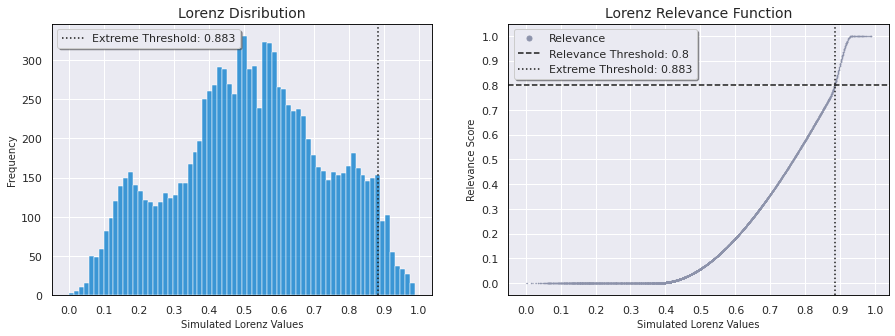

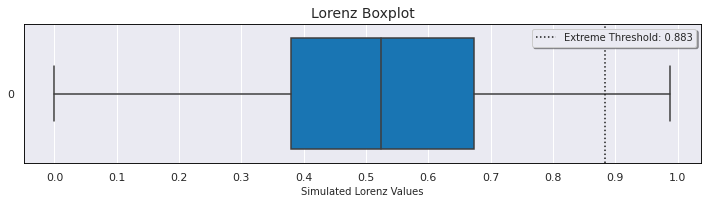

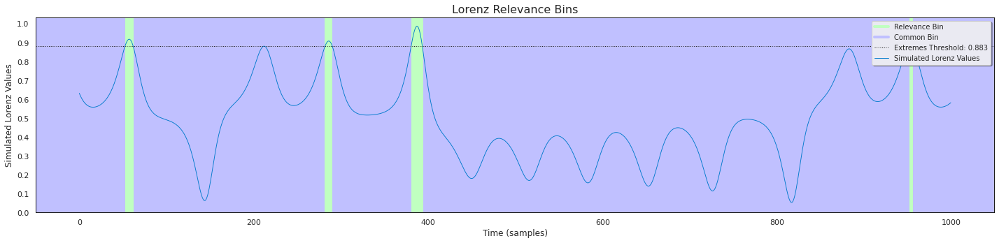

In [7]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)

#pu.PlotScaledData(data, TVAR)

r_Y_plot = RELEVANCE_FUNCTION.__call__(all_train_targets, combine=COMBINE) #relevance for plotting
k_Y_plot = [val >= RELEVANCE_THRESHOLD for val in r_Y_plot]
r_Y_plot = np.array(r_Y_plot)
k_Y_plot = np.array(k_Y_plot)

pu.PlotRelevance(all_train_targets, r_Y_plot, RELEVANCE_THRESHOLD, EXTREMES_THRESHOLD, TVAR, DATA_NAME)

#pu.PlotCaseWeightSurface(all_train_targets, RELEVANCE_FUNCTION, EXTREMES_THRESHOLD, 0.5, TVAR)
#pu.PlotUtilitySurface(all_train_targets, RELEVANCE_FUNCTION, EXTREMES_THRESHOLD, 0.5, TVAR)

#pu.PlotBins(all_train_targets,k_Y_plot,EXTREMES_THRESHOLD, TVAR, DATA_NAME)
pu.PlotBins(all_train_targets[3000:4000],k_Y_plot[3000:4000],EXTREMES_THRESHOLD, TVAR, DATA_NAME)

# **Resampling**

In [8]:
RES_STRATS = ["SMOTER_regular", "SMOTER_bin", "SMOTER_bin_t", "SMOTER_bin_r", "SMOTER_bin_tr", "GAN_CNN", "GAN_FNN"]

**Define GAN Models**

In [9]:
import GAN as gmod
importlib.reload(gmod)

n_gan_epochs = 120
gan_batch_size = 128

CNN_GENS=None; CNN_DISCS=None; FNN_GENS=None; FNN_DISC=None

if "GAN_CNN" in RES_STRATS:
    CNN_GENS, CNN_DISCS = gmod.getGAN(k_Xex,GAN_CNN_DIR, "CNN", SAMPLE_DIM, n_gan_epochs, gan_batch_size, RECORDER.log_print)
if "GAN_FNN" in RES_STRATS:
    FNN_GENS, FNN_DISCS = gmod.getGAN(k_Xex,GAN_FNN_DIR, "FNN", SAMPLE_DIM, n_gan_epochs, gan_batch_size, RECORDER.log_print)

RECORDER.save_param_dict({"GAN":{"nEpochs":n_gan_epochs,"batchSize": gan_batch_size}})
print("$$$$ Finished training GANs $$$$")

LOG: 19:28:38:068 Training CNN GAN with 120 epochs



  0%|          | 0/4 [00:00<?, ?it/s]

Step 1: Generator loss: 1.3105104565620422, discriminator loss: 1.366170883178711
Step 2: Generator loss: 0.6347030401229858, discriminator loss: 0.6802091598510742
Step 3: Generator loss: 0.6227620840072632, discriminator loss: 0.6792982816696167


  0%|          | 0/4 [00:00<?, ?it/s]

Step 4: Generator loss: 0.6128272414207458, discriminator loss: 0.6784814596176147
Step 5: Generator loss: 0.6029835939407349, discriminator loss: 0.6789950132369995
Step 6: Generator loss: 0.5950646996498108, discriminator loss: 0.6798133850097656
Step 7: Generator loss: 0.5890622138977051, discriminator loss: 0.6809512972831726


  0%|          | 0/4 [00:00<?, ?it/s]

Step 8: Generator loss: 0.5848512053489685, discriminator loss: 0.6823520660400391
Step 9: Generator loss: 0.5831183791160583, discriminator loss: 0.6847059726715088
Step 10: Generator loss: 0.5829997062683105, discriminator loss: 0.6852848529815674
Step 11: Generator loss: 0.5847567319869995, discriminator loss: 0.6847584843635559


  0%|          | 0/4 [00:00<?, ?it/s]

Step 12: Generator loss: 0.5881809592247009, discriminator loss: 0.6870353817939758
Step 13: Generator loss: 0.5936042070388794, discriminator loss: 0.6873978972434998
Step 14: Generator loss: 0.6007177829742432, discriminator loss: 0.6876543760299683
Step 15: Generator loss: 0.6092679500579834, discriminator loss: 0.6872043609619141


  0%|          | 0/4 [00:00<?, ?it/s]

Step 16: Generator loss: 0.6188225746154785, discriminator loss: 0.6861349940299988
Step 17: Generator loss: 0.6299460530281067, discriminator loss: 0.6857362985610962
Step 18: Generator loss: 0.6421665549278259, discriminator loss: 0.684708297252655
Step 19: Generator loss: 0.6545171737670898, discriminator loss: 0.6845921874046326


  0%|          | 0/4 [00:00<?, ?it/s]

Step 20: Generator loss: 0.6671338081359863, discriminator loss: 0.6837706565856934
Step 21: Generator loss: 0.6783129572868347, discriminator loss: 0.684191882610321
Step 22: Generator loss: 0.6878805160522461, discriminator loss: 0.6845716238021851
Step 23: Generator loss: 0.6967447996139526, discriminator loss: 0.6854966878890991


  0%|          | 0/4 [00:00<?, ?it/s]

Step 24: Generator loss: 0.7064914703369141, discriminator loss: 0.6879484057426453
Step 25: Generator loss: 0.7146790027618408, discriminator loss: 0.6890636682510376
Step 26: Generator loss: 0.7218447327613831, discriminator loss: 0.6913285255432129
Step 27: Generator loss: 0.7271722555160522, discriminator loss: 0.6919661164283752


  0%|          | 0/4 [00:00<?, ?it/s]

Step 28: Generator loss: 0.7341241836547852, discriminator loss: 0.6938725709915161
Step 29: Generator loss: 0.7390605807304382, discriminator loss: 0.6956186294555664
Step 30: Generator loss: 0.7437955141067505, discriminator loss: 0.6970860958099365
Step 31: Generator loss: 0.7482859492301941, discriminator loss: 0.6979177594184875


  0%|          | 0/4 [00:00<?, ?it/s]

Step 32: Generator loss: 0.7515970468521118, discriminator loss: 0.6983270645141602
Step 33: Generator loss: 0.7540954351425171, discriminator loss: 0.6986975073814392
Step 34: Generator loss: 0.7554816603660583, discriminator loss: 0.6991493701934814
Step 35: Generator loss: 0.7554729580879211, discriminator loss: 0.699518084526062


  0%|          | 0/4 [00:00<?, ?it/s]

Step 36: Generator loss: 0.7548577785491943, discriminator loss: 0.6991279125213623
Step 37: Generator loss: 0.753265380859375, discriminator loss: 0.6992589235305786
Step 38: Generator loss: 0.7507159113883972, discriminator loss: 0.6993212103843689
Step 39: Generator loss: 0.7475284337997437, discriminator loss: 0.6994865536689758


  0%|          | 0/4 [00:00<?, ?it/s]

Step 40: Generator loss: 0.7440530061721802, discriminator loss: 0.6991128921508789
Step 41: Generator loss: 0.7401641607284546, discriminator loss: 0.6991448402404785
Step 42: Generator loss: 0.7360612750053406, discriminator loss: 0.6976314187049866
Step 43: Generator loss: 0.732002317905426, discriminator loss: 0.698379397392273


  0%|          | 0/4 [00:00<?, ?it/s]

Step 44: Generator loss: 0.7280598878860474, discriminator loss: 0.6982390880584717
Step 45: Generator loss: 0.724284291267395, discriminator loss: 0.6979338526725769
Step 46: Generator loss: 0.7209136486053467, discriminator loss: 0.6973534822463989
Step 47: Generator loss: 0.7177750468254089, discriminator loss: 0.6970781087875366


  0%|          | 0/4 [00:00<?, ?it/s]

Step 48: Generator loss: 0.7152043581008911, discriminator loss: 0.697611927986145
Step 49: Generator loss: 0.7130798101425171, discriminator loss: 0.6973596811294556
Step 50: Generator loss: 0.7117177844047546, discriminator loss: 0.696699857711792
Step 51: Generator loss: 0.7106835842132568, discriminator loss: 0.6966050267219543


  0%|          | 0/4 [00:00<?, ?it/s]

Step 52: Generator loss: 0.7104335427284241, discriminator loss: 0.6966090202331543
Step 53: Generator loss: 0.7104623317718506, discriminator loss: 0.6969006061553955
Step 54: Generator loss: 0.7108606100082397, discriminator loss: 0.6964222192764282
Step 55: Generator loss: 0.7116419672966003, discriminator loss: 0.6966410875320435


  0%|          | 0/4 [00:00<?, ?it/s]

Step 56: Generator loss: 0.7127305269241333, discriminator loss: 0.6965028047561646
Step 57: Generator loss: 0.7137861251831055, discriminator loss: 0.6961537599563599
Step 58: Generator loss: 0.7148427963256836, discriminator loss: 0.6961300373077393
Step 59: Generator loss: 0.715825617313385, discriminator loss: 0.6976759433746338


  0%|          | 0/4 [00:00<?, ?it/s]

Step 60: Generator loss: 0.7166414260864258, discriminator loss: 0.6970617771148682
Step 61: Generator loss: 0.7173284888267517, discriminator loss: 0.6967953443527222
Step 62: Generator loss: 0.7172824144363403, discriminator loss: 0.6969203948974609
Step 63: Generator loss: 0.7172902822494507, discriminator loss: 0.696864664554596


  0%|          | 0/4 [00:00<?, ?it/s]

Step 64: Generator loss: 0.7177304029464722, discriminator loss: 0.6969678401947021
Step 65: Generator loss: 0.718576192855835, discriminator loss: 0.6969090104103088
Step 66: Generator loss: 0.7196848392486572, discriminator loss: 0.6953291893005371
Step 67: Generator loss: 0.7205960154533386, discriminator loss: 0.693095326423645


  0%|          | 0/4 [00:00<?, ?it/s]

Step 68: Generator loss: 0.7208510637283325, discriminator loss: 0.6923809051513672
Step 69: Generator loss: 0.7201176285743713, discriminator loss: 0.6904639005661011
Step 70: Generator loss: 0.7173334360122681, discriminator loss: 0.6901370882987976
Step 71: Generator loss: 0.7124179005622864, discriminator loss: 0.6895121335983276


  0%|          | 0/4 [00:00<?, ?it/s]

Step 72: Generator loss: 0.7045947313308716, discriminator loss: 0.6914529800415039
Step 73: Generator loss: 0.6927631497383118, discriminator loss: 0.6940964460372925
Step 74: Generator loss: 0.6831640601158142, discriminator loss: 0.6971268653869629
Step 75: Generator loss: 0.6732231974601746, discriminator loss: 0.7001222968101501


  0%|          | 0/4 [00:00<?, ?it/s]

Step 76: Generator loss: 0.6679339408874512, discriminator loss: 0.702279269695282
Step 77: Generator loss: 0.6641380786895752, discriminator loss: 0.7013996839523315
Step 78: Generator loss: 0.6651358008384705, discriminator loss: 0.7006921768188477
Step 79: Generator loss: 0.6692607998847961, discriminator loss: 0.697095513343811


  0%|          | 0/4 [00:00<?, ?it/s]

Step 80: Generator loss: 0.6760640144348145, discriminator loss: 0.6924171447753906
Step 81: Generator loss: 0.6830624341964722, discriminator loss: 0.6873375177383423
Step 82: Generator loss: 0.6912828683853149, discriminator loss: 0.6813075542449951
Step 83: Generator loss: 0.6985641121864319, discriminator loss: 0.6764543652534485


  0%|          | 0/4 [00:00<?, ?it/s]

Step 84: Generator loss: 0.7014855146408081, discriminator loss: 0.6728149056434631
Step 85: Generator loss: 0.7043615579605103, discriminator loss: 0.670549750328064
Step 86: Generator loss: 0.7046813368797302, discriminator loss: 0.6694818735122681
Step 87: Generator loss: 0.6977182626724243, discriminator loss: 0.6704632043838501


  0%|          | 0/4 [00:00<?, ?it/s]

Step 88: Generator loss: 0.6979092359542847, discriminator loss: 0.6708612442016602
Step 89: Generator loss: 0.6948016881942749, discriminator loss: 0.6711954474449158
Step 90: Generator loss: 0.6944566369056702, discriminator loss: 0.6703125238418579
Step 91: Generator loss: 0.6959604024887085, discriminator loss: 0.6700479388237


  0%|          | 0/4 [00:00<?, ?it/s]

Step 92: Generator loss: 0.7017277479171753, discriminator loss: 0.6670501232147217
Step 93: Generator loss: 0.7095813751220703, discriminator loss: 0.6639325618743896
Step 94: Generator loss: 0.7190613746643066, discriminator loss: 0.658750593662262
Step 95: Generator loss: 0.7313566207885742, discriminator loss: 0.652647852897644


  0%|          | 0/4 [00:00<?, ?it/s]

Step 96: Generator loss: 0.7444829940795898, discriminator loss: 0.6458433866500854
Step 97: Generator loss: 0.7584061622619629, discriminator loss: 0.6384953260421753
Step 98: Generator loss: 0.7721403241157532, discriminator loss: 0.6311553716659546
Step 99: Generator loss: 0.7858608961105347, discriminator loss: 0.6234370470046997


  0%|          | 0/4 [00:00<?, ?it/s]

Step 100: Generator loss: 0.7986001372337341, discriminator loss: 0.6156957149505615
Step 101: Generator loss: 0.810553252696991, discriminator loss: 0.6083061695098877
Step 102: Generator loss: 0.8209019303321838, discriminator loss: 0.6010828018188477
Step 103: Generator loss: 0.8292235136032104, discriminator loss: 0.5944166779518127


  0%|          | 0/4 [00:00<?, ?it/s]

Step 104: Generator loss: 0.834145188331604, discriminator loss: 0.5889875888824463
Step 105: Generator loss: 0.8361430764198303, discriminator loss: 0.5846560597419739
Step 106: Generator loss: 0.8320958018302917, discriminator loss: 0.5820099115371704
Step 107: Generator loss: 0.8244844079017639, discriminator loss: 0.5806605815887451


  0%|          | 0/4 [00:00<?, ?it/s]

Step 108: Generator loss: 0.8100594878196716, discriminator loss: 0.5822252631187439
Step 109: Generator loss: 0.792026937007904, discriminator loss: 0.5860199928283691
Step 110: Generator loss: 0.7766967415809631, discriminator loss: 0.589131772518158
Step 111: Generator loss: 0.7633822560310364, discriminator loss: 0.5912338495254517


  0%|          | 0/4 [00:00<?, ?it/s]

Step 112: Generator loss: 0.761541485786438, discriminator loss: 0.5890445709228516
Step 113: Generator loss: 0.7648202180862427, discriminator loss: 0.5837117433547974
Step 114: Generator loss: 0.7740347385406494, discriminator loss: 0.5765789747238159
Step 115: Generator loss: 0.7867521047592163, discriminator loss: 0.5666394233703613


  0%|          | 0/4 [00:00<?, ?it/s]

Step 116: Generator loss: 0.802294909954071, discriminator loss: 0.5572446584701538
Step 117: Generator loss: 0.8195797204971313, discriminator loss: 0.5455988645553589
Step 118: Generator loss: 0.8378539085388184, discriminator loss: 0.5353497862815857
Step 119: Generator loss: 0.8569163680076599, discriminator loss: 0.521805465221405


  0%|          | 0/4 [00:00<?, ?it/s]

Step 120: Generator loss: 0.8762826919555664, discriminator loss: 0.5123378038406372
Step 121: Generator loss: 0.8958911299705505, discriminator loss: 0.5009161233901978
Step 122: Generator loss: 0.9154402017593384, discriminator loss: 0.48928335309028625
Step 123: Generator loss: 0.9351234436035156, discriminator loss: 0.4783407747745514


  0%|          | 0/4 [00:00<?, ?it/s]

Step 124: Generator loss: 0.9545660018920898, discriminator loss: 0.4686157703399658
Step 125: Generator loss: 0.9733927249908447, discriminator loss: 0.4575842618942261
Step 126: Generator loss: 0.9918081760406494, discriminator loss: 0.4487011432647705
Step 127: Generator loss: 1.009177565574646, discriminator loss: 0.43923452496528625


  0%|          | 0/4 [00:00<?, ?it/s]

Step 128: Generator loss: 1.0238105058670044, discriminator loss: 0.43048256635665894
Step 129: Generator loss: 1.0363068580627441, discriminator loss: 0.42380788922309875
Step 130: Generator loss: 1.0436041355133057, discriminator loss: 0.4175749123096466
Step 131: Generator loss: 1.0379064083099365, discriminator loss: 0.413332998752594


  0%|          | 0/4 [00:00<?, ?it/s]

Step 132: Generator loss: 1.0168955326080322, discriminator loss: 0.41505277156829834
Step 133: Generator loss: 0.9849395751953125, discriminator loss: 0.423685222864151
Step 134: Generator loss: 0.9374439716339111, discriminator loss: 0.4363899827003479
Step 135: Generator loss: 0.8802957534790039, discriminator loss: 0.4594466984272003


  0%|          | 0/4 [00:00<?, ?it/s]

Step 136: Generator loss: 0.8217157125473022, discriminator loss: 0.4724602699279785
Step 137: Generator loss: 0.7839766144752502, discriminator loss: 0.4876384139060974
Step 138: Generator loss: 0.7752809524536133, discriminator loss: 0.4936158061027527
Step 139: Generator loss: 0.7752401232719421, discriminator loss: 0.49433302879333496


  0%|          | 0/4 [00:00<?, ?it/s]

Step 140: Generator loss: 0.7832023501396179, discriminator loss: 0.4935939311981201
Step 141: Generator loss: 0.7970763444900513, discriminator loss: 0.488270103931427
Step 142: Generator loss: 0.8126388192176819, discriminator loss: 0.4843177795410156
Step 143: Generator loss: 0.8262186646461487, discriminator loss: 0.47974893450737


  0%|          | 0/4 [00:00<?, ?it/s]

Step 144: Generator loss: 0.8436947464942932, discriminator loss: 0.47661054134368896
Step 145: Generator loss: 0.8612971305847168, discriminator loss: 0.47253668308258057
Step 146: Generator loss: 0.8857911825180054, discriminator loss: 0.4669799506664276
Step 147: Generator loss: 0.9124374389648438, discriminator loss: 0.457963228225708


  0%|          | 0/4 [00:00<?, ?it/s]

Step 148: Generator loss: 0.9416041970252991, discriminator loss: 0.45036187767982483
Step 149: Generator loss: 0.971950888633728, discriminator loss: 0.44097763299942017
Step 150: Generator loss: 1.0020971298217773, discriminator loss: 0.4334312081336975
Step 151: Generator loss: 1.031067132949829, discriminator loss: 0.4250818192958832


  0%|          | 0/4 [00:00<?, ?it/s]

Step 152: Generator loss: 1.0588653087615967, discriminator loss: 0.41752028465270996
Step 153: Generator loss: 1.0851385593414307, discriminator loss: 0.407970666885376
Step 154: Generator loss: 1.1091079711914062, discriminator loss: 0.40076178312301636
Step 155: Generator loss: 1.1288262605667114, discriminator loss: 0.39184075593948364


  0%|          | 0/4 [00:00<?, ?it/s]

Step 156: Generator loss: 1.1468524932861328, discriminator loss: 0.38777363300323486
Step 157: Generator loss: 1.1562402248382568, discriminator loss: 0.3821554183959961
Step 158: Generator loss: 1.1563529968261719, discriminator loss: 0.3786836564540863
Step 159: Generator loss: 1.1497385501861572, discriminator loss: 0.3744644224643707


  0%|          | 0/4 [00:00<?, ?it/s]

Step 160: Generator loss: 1.13163161277771, discriminator loss: 0.3752211332321167
Step 161: Generator loss: 1.119303822517395, discriminator loss: 0.37878406047821045
Step 162: Generator loss: 1.108539342880249, discriminator loss: 0.3769621253013611
Step 163: Generator loss: 1.1099592447280884, discriminator loss: 0.37393176555633545


  0%|          | 0/4 [00:00<?, ?it/s]

Step 164: Generator loss: 1.1172332763671875, discriminator loss: 0.36639633774757385
Step 165: Generator loss: 1.1306452751159668, discriminator loss: 0.36087435483932495
Step 166: Generator loss: 1.1471848487854004, discriminator loss: 0.35331299901008606
Step 167: Generator loss: 1.1654433012008667, discriminator loss: 0.3451272249221802


  0%|          | 0/4 [00:00<?, ?it/s]

Step 168: Generator loss: 1.1848328113555908, discriminator loss: 0.33758264780044556
Step 169: Generator loss: 1.2048676013946533, discriminator loss: 0.32956379652023315
Step 170: Generator loss: 1.2248533964157104, discriminator loss: 0.3222895860671997
Step 171: Generator loss: 1.2457780838012695, discriminator loss: 0.3139100670814514


  0%|          | 0/4 [00:00<?, ?it/s]

Step 172: Generator loss: 1.2653840780258179, discriminator loss: 0.3070763349533081
Step 173: Generator loss: 1.285064935684204, discriminator loss: 0.3007250726222992
Step 174: Generator loss: 1.30431067943573, discriminator loss: 0.2936561405658722
Step 175: Generator loss: 1.321211338043213, discriminator loss: 0.286851704120636


  0%|          | 0/4 [00:00<?, ?it/s]

Step 176: Generator loss: 1.337651014328003, discriminator loss: 0.2814808487892151
Step 177: Generator loss: 1.34720778465271, discriminator loss: 0.2770737111568451
Step 178: Generator loss: 1.3458654880523682, discriminator loss: 0.2761203348636627
Step 179: Generator loss: 1.3310840129852295, discriminator loss: 0.27368032932281494


  0%|          | 0/4 [00:00<?, ?it/s]

Step 180: Generator loss: 1.2849055528640747, discriminator loss: 0.28204259276390076
Step 181: Generator loss: 1.2052099704742432, discriminator loss: 0.2960985004901886
Step 182: Generator loss: 1.084012508392334, discriminator loss: 0.3223644495010376
Step 183: Generator loss: 0.9565054774284363, discriminator loss: 0.3621438145637512


  0%|          | 0/4 [00:00<?, ?it/s]

Step 184: Generator loss: 0.8445730209350586, discriminator loss: 0.4024186134338379
Step 185: Generator loss: 0.7655124664306641, discriminator loss: 0.4348245859146118
Step 186: Generator loss: 0.737653374671936, discriminator loss: 0.44843870401382446
Step 187: Generator loss: 0.7340667843818665, discriminator loss: 0.45647132396698


  0%|          | 0/4 [00:00<?, ?it/s]

Step 188: Generator loss: 0.7567973732948303, discriminator loss: 0.4478169083595276
Step 189: Generator loss: 0.788462221622467, discriminator loss: 0.4370119869709015
Step 190: Generator loss: 0.8264678120613098, discriminator loss: 0.4255109429359436
Step 191: Generator loss: 0.8696988821029663, discriminator loss: 0.4128202795982361


  0%|          | 0/4 [00:00<?, ?it/s]

Step 192: Generator loss: 0.9153146147727966, discriminator loss: 0.39911985397338867
Step 193: Generator loss: 0.9626889228820801, discriminator loss: 0.3878488540649414
Step 194: Generator loss: 1.0107133388519287, discriminator loss: 0.37506330013275146
Step 195: Generator loss: 1.0588293075561523, discriminator loss: 0.36404091119766235


  0%|          | 0/4 [00:00<?, ?it/s]

Step 196: Generator loss: 1.1061172485351562, discriminator loss: 0.354625403881073
Step 197: Generator loss: 1.1520311832427979, discriminator loss: 0.3432998061180115
Step 198: Generator loss: 1.1960793733596802, discriminator loss: 0.33562949299812317
Step 199: Generator loss: 1.237991452217102, discriminator loss: 0.327598512172699


  0%|          | 0/4 [00:00<?, ?it/s]

Step 200: Generator loss: 1.2771596908569336, discriminator loss: 0.3177591562271118
Step 201: Generator loss: 1.313624620437622, discriminator loss: 0.31082436442375183
Step 202: Generator loss: 1.3471482992172241, discriminator loss: 0.30403608083724976
Step 203: Generator loss: 1.3782336711883545, discriminator loss: 0.29420047998428345


  0%|          | 0/4 [00:00<?, ?it/s]

Step 204: Generator loss: 1.4060434103012085, discriminator loss: 0.28867822885513306
Step 205: Generator loss: 1.431574821472168, discriminator loss: 0.279800146818161
Step 206: Generator loss: 1.454830288887024, discriminator loss: 0.27422070503234863
Step 207: Generator loss: 1.475564956665039, discriminator loss: 0.2663801908493042


  0%|          | 0/4 [00:00<?, ?it/s]

Step 208: Generator loss: 1.4946523904800415, discriminator loss: 0.2605862319469452
Step 209: Generator loss: 1.5109410285949707, discriminator loss: 0.2538011074066162
Step 210: Generator loss: 1.5259625911712646, discriminator loss: 0.24708691239356995
Step 211: Generator loss: 1.5381864309310913, discriminator loss: 0.24056974053382874


  0%|          | 0/4 [00:00<?, ?it/s]

Step 212: Generator loss: 1.5490561723709106, discriminator loss: 0.23475676774978638
Step 213: Generator loss: 1.5543895959854126, discriminator loss: 0.2311495989561081
Step 214: Generator loss: 1.551249384880066, discriminator loss: 0.22928541898727417
Step 215: Generator loss: 1.524430751800537, discriminator loss: 0.22960127890110016


  0%|          | 0/4 [00:00<?, ?it/s]

Step 216: Generator loss: 1.488698959350586, discriminator loss: 0.23172232508659363
Step 217: Generator loss: 1.4039630889892578, discriminator loss: 0.24041375517845154
Step 218: Generator loss: 1.2759273052215576, discriminator loss: 0.258823961019516
Step 219: Generator loss: 1.1492735147476196, discriminator loss: 0.2914417088031769


  0%|          | 0/4 [00:00<?, ?it/s]

Step 220: Generator loss: 1.0302780866622925, discriminator loss: 0.32075899839401245
Step 221: Generator loss: 0.9611585140228271, discriminator loss: 0.34214645624160767
Step 222: Generator loss: 0.9345906972885132, discriminator loss: 0.35005027055740356
Step 223: Generator loss: 0.9394891858100891, discriminator loss: 0.3494555950164795


  0%|          | 0/4 [00:00<?, ?it/s]

Step 224: Generator loss: 0.9704445004463196, discriminator loss: 0.344129353761673
Step 225: Generator loss: 1.0098183155059814, discriminator loss: 0.335541307926178
Step 226: Generator loss: 1.0553730726242065, discriminator loss: 0.32760053873062134
Step 227: Generator loss: 1.105065941810608, discriminator loss: 0.3158208429813385


  0%|          | 0/4 [00:00<?, ?it/s]

Step 228: Generator loss: 1.1578160524368286, discriminator loss: 0.30660396814346313
Step 229: Generator loss: 1.2115352153778076, discriminator loss: 0.297499418258667
Step 230: Generator loss: 1.2649730443954468, discriminator loss: 0.2912280857563019
Step 231: Generator loss: 1.3174341917037964, discriminator loss: 0.2842544913291931


  0%|          | 0/4 [00:00<?, ?it/s]

Step 232: Generator loss: 1.367938756942749, discriminator loss: 0.27626049518585205
Step 233: Generator loss: 1.4160834550857544, discriminator loss: 0.2712464928627014
Step 234: Generator loss: 1.4611060619354248, discriminator loss: 0.2639155983924866
Step 235: Generator loss: 1.5026779174804688, discriminator loss: 0.25931835174560547


  0%|          | 0/4 [00:00<?, ?it/s]

Step 236: Generator loss: 1.5403145551681519, discriminator loss: 0.25643277168273926
Step 237: Generator loss: 1.5739647150039673, discriminator loss: 0.24991333484649658
Step 238: Generator loss: 1.6037906408309937, discriminator loss: 0.24383077025413513
Step 239: Generator loss: 1.6301534175872803, discriminator loss: 0.23507916927337646


  0%|          | 0/4 [00:00<?, ?it/s]

Step 240: Generator loss: 1.652853012084961, discriminator loss: 0.23553897440433502
Step 241: Generator loss: 1.6722966432571411, discriminator loss: 0.22905707359313965
Step 242: Generator loss: 1.6886332035064697, discriminator loss: 0.225997194647789
Step 243: Generator loss: 1.7024717330932617, discriminator loss: 0.22017893195152283


  0%|          | 0/4 [00:00<?, ?it/s]

Step 244: Generator loss: 1.7139030694961548, discriminator loss: 0.21639248728752136
Step 245: Generator loss: 1.723785161972046, discriminator loss: 0.2104361355304718
Step 246: Generator loss: 1.7322993278503418, discriminator loss: 0.20771044492721558
Step 247: Generator loss: 1.739484429359436, discriminator loss: 0.20330312848091125


  0%|          | 0/4 [00:00<?, ?it/s]

Step 248: Generator loss: 1.7460289001464844, discriminator loss: 0.2001228779554367
Step 249: Generator loss: 1.7522060871124268, discriminator loss: 0.1944957673549652
Step 250: Generator loss: 1.7583329677581787, discriminator loss: 0.19056960940361023
Step 251: Generator loss: 1.7648497819900513, discriminator loss: 0.18600669503211975


  0%|          | 0/4 [00:00<?, ?it/s]

Step 252: Generator loss: 1.771591305732727, discriminator loss: 0.18400374054908752
Step 253: Generator loss: 1.7790591716766357, discriminator loss: 0.18027254939079285
Step 254: Generator loss: 1.7871983051300049, discriminator loss: 0.17713041603565216
Step 255: Generator loss: 1.7961218357086182, discriminator loss: 0.17379015684127808


  0%|          | 0/4 [00:00<?, ?it/s]

Step 256: Generator loss: 1.8057706356048584, discriminator loss: 0.17101700603961945
Step 257: Generator loss: 1.8162809610366821, discriminator loss: 0.1680205911397934
Step 258: Generator loss: 1.8278740644454956, discriminator loss: 0.16435840725898743
Step 259: Generator loss: 1.839975118637085, discriminator loss: 0.16248466074466705


  0%|          | 0/4 [00:00<?, ?it/s]

Step 260: Generator loss: 1.8530116081237793, discriminator loss: 0.15934936702251434
Step 261: Generator loss: 1.866835355758667, discriminator loss: 0.15650491416454315
Step 262: Generator loss: 1.8813049793243408, discriminator loss: 0.15436673164367676
Step 263: Generator loss: 1.896315097808838, discriminator loss: 0.15075378119945526


  0%|          | 0/4 [00:00<?, ?it/s]

Step 264: Generator loss: 1.912075161933899, discriminator loss: 0.14896832406520844
Step 265: Generator loss: 1.9280080795288086, discriminator loss: 0.1469249725341797
Step 266: Generator loss: 1.9444990158081055, discriminator loss: 0.14363497495651245
Step 267: Generator loss: 1.9613285064697266, discriminator loss: 0.14226418733596802


  0%|          | 0/4 [00:00<?, ?it/s]

Step 268: Generator loss: 1.978082299232483, discriminator loss: 0.138650044798851
Step 269: Generator loss: 1.995092511177063, discriminator loss: 0.13778004050254822
Step 270: Generator loss: 2.0120646953582764, discriminator loss: 0.13522279262542725
Step 271: Generator loss: 2.028747797012329, discriminator loss: 0.1349622905254364


  0%|          | 0/4 [00:00<?, ?it/s]

Step 272: Generator loss: 2.045360565185547, discriminator loss: 0.13089483976364136
Step 273: Generator loss: 2.06109356880188, discriminator loss: 0.13059808313846588
Step 274: Generator loss: 2.077568769454956, discriminator loss: 0.12638995051383972
Step 275: Generator loss: 2.0931856632232666, discriminator loss: 0.125524640083313


  0%|          | 0/4 [00:00<?, ?it/s]

Step 276: Generator loss: 2.1078951358795166, discriminator loss: 0.12345075607299805
Step 277: Generator loss: 2.1228716373443604, discriminator loss: 0.12180445343255997
Step 278: Generator loss: 2.1364188194274902, discriminator loss: 0.12120214849710464
Step 279: Generator loss: 2.14939546585083, discriminator loss: 0.11797453463077545


  0%|          | 0/4 [00:00<?, ?it/s]

Step 280: Generator loss: 2.161785125732422, discriminator loss: 0.11735813319683075
Step 281: Generator loss: 2.1723382472991943, discriminator loss: 0.11576627194881439
Step 282: Generator loss: 2.1795451641082764, discriminator loss: 0.11505228281021118
Step 283: Generator loss: 2.181331157684326, discriminator loss: 0.11339163035154343


  0%|          | 0/4 [00:00<?, ?it/s]

Step 284: Generator loss: 2.1738977432250977, discriminator loss: 0.11393651366233826
Step 285: Generator loss: 2.147826910018921, discriminator loss: 0.11517225205898285
Step 286: Generator loss: 2.088473081588745, discriminator loss: 0.1184839978814125
Step 287: Generator loss: 1.943498969078064, discriminator loss: 0.1301681250333786


  0%|          | 0/4 [00:00<?, ?it/s]

Step 288: Generator loss: 1.7129665613174438, discriminator loss: 0.1544739007949829
Step 289: Generator loss: 1.397923469543457, discriminator loss: 0.19569995999336243
Step 290: Generator loss: 1.1137855052947998, discriminator loss: 0.26411402225494385
Step 291: Generator loss: 0.8837863802909851, discriminator loss: 0.3312909007072449


  0%|          | 0/4 [00:00<?, ?it/s]

Step 292: Generator loss: 0.7792499661445618, discriminator loss: 0.38121262192726135
Step 293: Generator loss: 0.7488802671432495, discriminator loss: 0.3994854688644409
Step 294: Generator loss: 0.764609158039093, discriminator loss: 0.4012986123561859
Step 295: Generator loss: 0.7950019836425781, discriminator loss: 0.3937620520591736


  0%|          | 0/4 [00:00<?, ?it/s]

Step 296: Generator loss: 0.8335204720497131, discriminator loss: 0.3864883780479431
Step 297: Generator loss: 0.8725548982620239, discriminator loss: 0.37850090861320496
Step 298: Generator loss: 0.91608726978302, discriminator loss: 0.3729201555252075
Step 299: Generator loss: 0.9755436182022095, discriminator loss: 0.3602603077888489


  0%|          | 0/4 [00:00<?, ?it/s]

Step 300: Generator loss: 1.042603850364685, discriminator loss: 0.3498006761074066
Step 301: Generator loss: 1.114837646484375, discriminator loss: 0.33892253041267395
Step 302: Generator loss: 1.1887142658233643, discriminator loss: 0.3278711438179016
Step 303: Generator loss: 1.2612009048461914, discriminator loss: 0.31713101267814636


  0%|          | 0/4 [00:00<?, ?it/s]

Step 304: Generator loss: 1.3297839164733887, discriminator loss: 0.3131289482116699
Step 305: Generator loss: 1.3929507732391357, discriminator loss: 0.30720818042755127
Step 306: Generator loss: 1.4494566917419434, discriminator loss: 0.3028320372104645
Step 307: Generator loss: 1.499066710472107, discriminator loss: 0.29401689767837524


  0%|          | 0/4 [00:00<?, ?it/s]

Step 308: Generator loss: 1.5412275791168213, discriminator loss: 0.29200518131256104
Step 309: Generator loss: 1.5762860774993896, discriminator loss: 0.2840539813041687
Step 310: Generator loss: 1.6046572923660278, discriminator loss: 0.27717724442481995
Step 311: Generator loss: 1.6266721487045288, discriminator loss: 0.266629695892334


  0%|          | 0/4 [00:00<?, ?it/s]

Step 312: Generator loss: 1.6432956457138062, discriminator loss: 0.2628617584705353
Step 313: Generator loss: 1.6549817323684692, discriminator loss: 0.2541155219078064
Step 314: Generator loss: 1.6616168022155762, discriminator loss: 0.2482948750257492
Step 315: Generator loss: 1.665466070175171, discriminator loss: 0.23745036125183105


  0%|          | 0/4 [00:00<?, ?it/s]

Step 316: Generator loss: 1.6656041145324707, discriminator loss: 0.23266810178756714
Step 317: Generator loss: 1.664210557937622, discriminator loss: 0.22383573651313782
Step 318: Generator loss: 1.65973961353302, discriminator loss: 0.21945147216320038
Step 319: Generator loss: 1.6518421173095703, discriminator loss: 0.21487760543823242


  0%|          | 0/4 [00:00<?, ?it/s]

Step 320: Generator loss: 1.63893723487854, discriminator loss: 0.20896218717098236
Step 321: Generator loss: 1.6136683225631714, discriminator loss: 0.207148939371109
Step 322: Generator loss: 1.5649648904800415, discriminator loss: 0.20946156978607178
Step 323: Generator loss: 1.5015383958816528, discriminator loss: 0.21272063255310059


  0%|          | 0/4 [00:00<?, ?it/s]

Step 324: Generator loss: 1.4229552745819092, discriminator loss: 0.2211083620786667
Step 325: Generator loss: 1.3539299964904785, discriminator loss: 0.2310289740562439
Step 326: Generator loss: 1.3238815069198608, discriminator loss: 0.23424044251441956
Step 327: Generator loss: 1.3183636665344238, discriminator loss: 0.23554807901382446


  0%|          | 0/4 [00:00<?, ?it/s]

Step 328: Generator loss: 1.3341565132141113, discriminator loss: 0.22991883754730225
Step 329: Generator loss: 1.3589831590652466, discriminator loss: 0.2240261435508728
Step 330: Generator loss: 1.3895010948181152, discriminator loss: 0.2182876467704773
Step 331: Generator loss: 1.4238508939743042, discriminator loss: 0.2110050618648529


  0%|          | 0/4 [00:00<?, ?it/s]

Step 332: Generator loss: 1.4609493017196655, discriminator loss: 0.20564594864845276
Step 333: Generator loss: 1.5000147819519043, discriminator loss: 0.1984238177537918
Step 334: Generator loss: 1.540392518043518, discriminator loss: 0.19332639873027802
Step 335: Generator loss: 1.5814775228500366, discriminator loss: 0.18876942992210388


  0%|          | 0/4 [00:00<?, ?it/s]

Step 336: Generator loss: 1.6229315996170044, discriminator loss: 0.1807657927274704
Step 337: Generator loss: 1.664369821548462, discriminator loss: 0.17679280042648315
Step 338: Generator loss: 1.7053606510162354, discriminator loss: 0.17112427949905396
Step 339: Generator loss: 1.7458031177520752, discriminator loss: 0.16481342911720276


  0%|          | 0/4 [00:00<?, ?it/s]

Step 340: Generator loss: 1.7851459980010986, discriminator loss: 0.16082492470741272
Step 341: Generator loss: 1.8232600688934326, discriminator loss: 0.1572052240371704
Step 342: Generator loss: 1.860020399093628, discriminator loss: 0.15257075428962708
Step 343: Generator loss: 1.8954626321792603, discriminator loss: 0.14683954417705536


  0%|          | 0/4 [00:00<?, ?it/s]

Step 344: Generator loss: 1.9295066595077515, discriminator loss: 0.14432065188884735
Step 345: Generator loss: 1.9620552062988281, discriminator loss: 0.14002928137779236
Step 346: Generator loss: 1.992861270904541, discriminator loss: 0.13859592378139496
Step 347: Generator loss: 2.022200584411621, discriminator loss: 0.1309177428483963


  0%|          | 0/4 [00:00<?, ?it/s]

Step 348: Generator loss: 2.050097942352295, discriminator loss: 0.13056808710098267
Step 349: Generator loss: 2.0764598846435547, discriminator loss: 0.1269243359565735
Step 350: Generator loss: 2.1013307571411133, discriminator loss: 0.12349171936511993
Step 351: Generator loss: 2.125023365020752, discriminator loss: 0.12030729651451111


  0%|          | 0/4 [00:00<?, ?it/s]

Step 352: Generator loss: 2.1474413871765137, discriminator loss: 0.11764447391033173
Step 353: Generator loss: 2.168712615966797, discriminator loss: 0.11445873975753784
Step 354: Generator loss: 2.189042091369629, discriminator loss: 0.1127915233373642
Step 355: Generator loss: 2.208383321762085, discriminator loss: 0.11030250787734985


  0%|          | 0/4 [00:00<?, ?it/s]

Step 356: Generator loss: 2.226840019226074, discriminator loss: 0.10767742991447449
Step 357: Generator loss: 2.2445595264434814, discriminator loss: 0.1051492840051651
Step 358: Generator loss: 2.261789321899414, discriminator loss: 0.10198641568422318
Step 359: Generator loss: 2.2785189151763916, discriminator loss: 0.0994475930929184


  0%|          | 0/4 [00:00<?, ?it/s]

Step 360: Generator loss: 2.2951598167419434, discriminator loss: 0.09769777953624725
Step 361: Generator loss: 2.3111326694488525, discriminator loss: 0.09601114690303802
Step 362: Generator loss: 2.3270535469055176, discriminator loss: 0.09424136579036713
Step 363: Generator loss: 2.342515707015991, discriminator loss: 0.09265446662902832


  0%|          | 0/4 [00:00<?, ?it/s]

Step 364: Generator loss: 2.357872486114502, discriminator loss: 0.09002698212862015
Step 365: Generator loss: 2.3729724884033203, discriminator loss: 0.08880310505628586
Step 366: Generator loss: 2.388176918029785, discriminator loss: 0.08711115270853043
Step 367: Generator loss: 2.403609037399292, discriminator loss: 0.0844859629869461


  0%|          | 0/4 [00:00<?, ?it/s]

Step 368: Generator loss: 2.418180227279663, discriminator loss: 0.0829990804195404
Step 369: Generator loss: 2.4335665702819824, discriminator loss: 0.08230352401733398
Step 370: Generator loss: 2.447643518447876, discriminator loss: 0.08089189231395721
Step 371: Generator loss: 2.4618775844573975, discriminator loss: 0.07940065860748291


  0%|          | 0/4 [00:00<?, ?it/s]

Step 372: Generator loss: 2.4756152629852295, discriminator loss: 0.07817469537258148
Step 373: Generator loss: 2.487957000732422, discriminator loss: 0.07621106505393982
Step 374: Generator loss: 2.4987998008728027, discriminator loss: 0.07537664473056793
Step 375: Generator loss: 2.5045619010925293, discriminator loss: 0.07569240033626556


  0%|          | 0/4 [00:00<?, ?it/s]

Step 376: Generator loss: 2.502413272857666, discriminator loss: 0.0741613432765007
Step 377: Generator loss: 2.4727625846862793, discriminator loss: 0.0745992660522461
Step 378: Generator loss: 2.4184205532073975, discriminator loss: 0.07829242199659348
Step 379: Generator loss: 2.2700014114379883, discriminator loss: 0.08552699536085129


  0%|          | 0/4 [00:00<?, ?it/s]

Step 380: Generator loss: 2.079066753387451, discriminator loss: 0.09779375791549683
Step 381: Generator loss: 1.8377611637115479, discriminator loss: 0.11654810607433319
Step 382: Generator loss: 1.6767241954803467, discriminator loss: 0.13589157164096832
Step 383: Generator loss: 1.6037542819976807, discriminator loss: 0.1451697200536728


  0%|          | 0/4 [00:00<?, ?it/s]

Step 384: Generator loss: 1.6014466285705566, discriminator loss: 0.147665336728096
Step 385: Generator loss: 1.628623604774475, discriminator loss: 0.14476270973682404
Step 386: Generator loss: 1.6714601516723633, discriminator loss: 0.14058981835842133
Step 387: Generator loss: 1.7217493057250977, discriminator loss: 0.13656051456928253


  0%|          | 0/4 [00:00<?, ?it/s]

Step 388: Generator loss: 1.7764830589294434, discriminator loss: 0.1315736174583435
Step 389: Generator loss: 1.8334234952926636, discriminator loss: 0.12721017003059387
Step 390: Generator loss: 1.8914361000061035, discriminator loss: 0.12321445345878601
Step 391: Generator loss: 1.9494891166687012, discriminator loss: 0.12018877267837524


  0%|          | 0/4 [00:00<?, ?it/s]

Step 392: Generator loss: 2.0067138671875, discriminator loss: 0.11620466411113739
Step 393: Generator loss: 2.0628535747528076, discriminator loss: 0.11224623024463654
Step 394: Generator loss: 2.1169869899749756, discriminator loss: 0.10959217697381973
Step 395: Generator loss: 2.1685473918914795, discriminator loss: 0.10753857344388962


  0%|          | 0/4 [00:00<?, ?it/s]

Step 396: Generator loss: 2.2172927856445312, discriminator loss: 0.10514548420906067
Step 397: Generator loss: 2.2628540992736816, discriminator loss: 0.10221429169178009
Step 398: Generator loss: 2.305117130279541, discriminator loss: 0.10103811323642731
Step 399: Generator loss: 2.343867540359497, discriminator loss: 0.0994802862405777


  0%|          | 0/4 [00:00<?, ?it/s]

Step 400: Generator loss: 2.379016160964966, discriminator loss: 0.09818455576896667
Step 401: Generator loss: 2.4108896255493164, discriminator loss: 0.09557105600833893
Step 402: Generator loss: 2.4394795894622803, discriminator loss: 0.09334995597600937
Step 403: Generator loss: 2.465226173400879, discriminator loss: 0.08990469574928284


  0%|          | 0/4 [00:00<?, ?it/s]

Step 404: Generator loss: 2.487973928451538, discriminator loss: 0.0909830629825592
Step 405: Generator loss: 2.5079379081726074, discriminator loss: 0.08882908523082733
Step 406: Generator loss: 2.5257461071014404, discriminator loss: 0.08571271598339081
Step 407: Generator loss: 2.5412819385528564, discriminator loss: 0.08493886888027191


  0%|          | 0/4 [00:00<?, ?it/s]

Step 408: Generator loss: 2.555079221725464, discriminator loss: 0.0831349790096283
Step 409: Generator loss: 2.567089319229126, discriminator loss: 0.08215370029211044
Step 410: Generator loss: 2.5777337551116943, discriminator loss: 0.08011431992053986
Step 411: Generator loss: 2.587153673171997, discriminator loss: 0.07817086577415466


  0%|          | 0/4 [00:00<?, ?it/s]

Step 412: Generator loss: 2.5957586765289307, discriminator loss: 0.07727938890457153
Step 413: Generator loss: 2.6036994457244873, discriminator loss: 0.07512261718511581
Step 414: Generator loss: 2.611133337020874, discriminator loss: 0.07447242736816406
Step 415: Generator loss: 2.618324041366577, discriminator loss: 0.07250052690505981


  0%|          | 0/4 [00:00<?, ?it/s]

Step 416: Generator loss: 2.625440835952759, discriminator loss: 0.07113690674304962
Step 417: Generator loss: 2.6324238777160645, discriminator loss: 0.07028253376483917
Step 418: Generator loss: 2.6396331787109375, discriminator loss: 0.06913894414901733
Step 419: Generator loss: 2.6469759941101074, discriminator loss: 0.0682440996170044


  0%|          | 0/4 [00:00<?, ?it/s]

Step 420: Generator loss: 2.654693603515625, discriminator loss: 0.0663568377494812
Step 421: Generator loss: 2.6626274585723877, discriminator loss: 0.06599299609661102
Step 422: Generator loss: 2.671236276626587, discriminator loss: 0.06470231711864471
Step 423: Generator loss: 2.6800873279571533, discriminator loss: 0.06356342136859894


  0%|          | 0/4 [00:00<?, ?it/s]

Step 424: Generator loss: 2.6896982192993164, discriminator loss: 0.06249251216650009
Step 425: Generator loss: 2.699293375015259, discriminator loss: 0.06184001639485359
Step 426: Generator loss: 2.709925651550293, discriminator loss: 0.060573939234018326
Step 427: Generator loss: 2.720188856124878, discriminator loss: 0.06054573878645897


  0%|          | 0/4 [00:00<?, ?it/s]

Step 428: Generator loss: 2.7317912578582764, discriminator loss: 0.05896212160587311
Step 429: Generator loss: 2.7432668209075928, discriminator loss: 0.0578426793217659
Step 430: Generator loss: 2.75492525100708, discriminator loss: 0.05799069255590439
Step 431: Generator loss: 2.7669661045074463, discriminator loss: 0.05640610307455063


  0%|          | 0/4 [00:00<?, ?it/s]

Step 432: Generator loss: 2.7789812088012695, discriminator loss: 0.05543404817581177
Step 433: Generator loss: 2.7913527488708496, discriminator loss: 0.055260345339775085
Step 434: Generator loss: 2.8035078048706055, discriminator loss: 0.05507657676935196
Step 435: Generator loss: 2.8141863346099854, discriminator loss: 0.05308665335178375


  0%|          | 0/4 [00:00<?, ?it/s]

Step 436: Generator loss: 2.825634002685547, discriminator loss: 0.053201913833618164
Step 437: Generator loss: 2.832817554473877, discriminator loss: 0.0526733472943306
Step 438: Generator loss: 2.83528995513916, discriminator loss: 0.052603453397750854
Step 439: Generator loss: 2.8334808349609375, discriminator loss: 0.05179646611213684


  0%|          | 0/4 [00:00<?, ?it/s]

Step 440: Generator loss: 2.7937960624694824, discriminator loss: 0.05316772684454918
Step 441: Generator loss: 2.698636054992676, discriminator loss: 0.055801741778850555
Step 442: Generator loss: 2.4951536655426025, discriminator loss: 0.06360605359077454
Step 443: Generator loss: 2.160292148590088, discriminator loss: 0.0843532606959343


  0%|          | 0/4 [00:00<?, ?it/s]

Step 444: Generator loss: 1.8062173128128052, discriminator loss: 0.1186380535364151
Step 445: Generator loss: 1.3939998149871826, discriminator loss: 0.16922903060913086
Step 446: Generator loss: 1.2355108261108398, discriminator loss: 0.20299099385738373
Step 447: Generator loss: 1.2130558490753174, discriminator loss: 0.21539556980133057


  0%|          | 0/4 [00:00<?, ?it/s]

Step 448: Generator loss: 1.2565199136734009, discriminator loss: 0.2096291035413742
Step 449: Generator loss: 1.3341394662857056, discriminator loss: 0.19899791479110718
Step 450: Generator loss: 1.4306279420852661, discriminator loss: 0.18490514159202576
Step 451: Generator loss: 1.5375341176986694, discriminator loss: 0.17186753451824188


  0%|          | 0/4 [00:00<?, ?it/s]

Step 452: Generator loss: 1.6508920192718506, discriminator loss: 0.15952923893928528
Step 453: Generator loss: 1.7657232284545898, discriminator loss: 0.1510639786720276
Step 454: Generator loss: 1.8783705234527588, discriminator loss: 0.1448189616203308
Step 455: Generator loss: 1.9864839315414429, discriminator loss: 0.13708877563476562


  0%|          | 0/4 [00:00<?, ?it/s]

Step 456: Generator loss: 2.0875656604766846, discriminator loss: 0.13380585610866547
Step 457: Generator loss: 2.1792960166931152, discriminator loss: 0.13372839987277985
Step 458: Generator loss: 2.2602345943450928, discriminator loss: 0.13205741345882416
Step 459: Generator loss: 2.3297245502471924, discriminator loss: 0.13076052069664001


  0%|          | 0/4 [00:00<?, ?it/s]

Step 460: Generator loss: 2.3872992992401123, discriminator loss: 0.12918433547019958
Step 461: Generator loss: 2.4328455924987793, discriminator loss: 0.1294698268175125
Step 462: Generator loss: 2.4668796062469482, discriminator loss: 0.12754009664058685
Step 463: Generator loss: 2.490720272064209, discriminator loss: 0.1230836808681488


  0%|          | 0/4 [00:00<?, ?it/s]

Step 464: Generator loss: 2.5051984786987305, discriminator loss: 0.12146415561437607
Step 465: Generator loss: 2.511352062225342, discriminator loss: 0.11953505873680115
Step 466: Generator loss: 2.5106515884399414, discriminator loss: 0.11632807552814484
Step 467: Generator loss: 2.504521131515503, discriminator loss: 0.11157884448766708


  0%|          | 0/4 [00:00<?, ?it/s]

Step 468: Generator loss: 2.494215726852417, discriminator loss: 0.108706034719944
Step 469: Generator loss: 2.48097825050354, discriminator loss: 0.10495777428150177
Step 470: Generator loss: 2.4659929275512695, discriminator loss: 0.1028292253613472
Step 471: Generator loss: 2.4502310752868652, discriminator loss: 0.09939830005168915


  0%|          | 0/4 [00:00<?, ?it/s]

Step 472: Generator loss: 2.434685707092285, discriminator loss: 0.09606452286243439
Step 473: Generator loss: 2.4201295375823975, discriminator loss: 0.09415648132562637
Step 474: Generator loss: 2.406935930252075, discriminator loss: 0.09302668273448944
Step 475: Generator loss: 2.39582896232605, discriminator loss: 0.08949048072099686


  0%|          | 0/4 [00:00<?, ?it/s]

Step 476: Generator loss: 2.387267589569092, discriminator loss: 0.08831161260604858
Step 477: Generator loss: 2.381391763687134, discriminator loss: 0.0866413414478302
Step 478: Generator loss: 2.3784608840942383, discriminator loss: 0.08528447151184082
Step 479: Generator loss: 2.378363609313965, discriminator loss: 0.08446477353572845
LOG: 19:38:33:222 Training FNN GAN with 120 epochs



  0%|          | 0/4 [00:00<?, ?it/s]

Step 1: Generator loss: 1.4410768151283264, discriminator loss: 1.3967870473861694
Step 2: Generator loss: 0.7196378111839294, discriminator loss: 0.6977531313896179
Step 3: Generator loss: 0.7190184593200684, discriminator loss: 0.6972999572753906


  0%|          | 0/4 [00:00<?, ?it/s]

Step 4: Generator loss: 0.7183154821395874, discriminator loss: 0.696914553642273
Step 5: Generator loss: 0.7177016735076904, discriminator loss: 0.6964605450630188
Step 6: Generator loss: 0.7171241044998169, discriminator loss: 0.6960992813110352
Step 7: Generator loss: 0.716576099395752, discriminator loss: 0.6957882642745972


  0%|          | 0/4 [00:00<?, ?it/s]

Step 8: Generator loss: 0.7158660888671875, discriminator loss: 0.6953454613685608
Step 9: Generator loss: 0.7151740193367004, discriminator loss: 0.6950218677520752
Step 10: Generator loss: 0.7146009802818298, discriminator loss: 0.6946828365325928
Step 11: Generator loss: 0.71402508020401, discriminator loss: 0.6944524645805359


  0%|          | 0/4 [00:00<?, ?it/s]

Step 12: Generator loss: 0.7132872939109802, discriminator loss: 0.6940425634384155
Step 13: Generator loss: 0.7126352787017822, discriminator loss: 0.6937183141708374
Step 14: Generator loss: 0.71198570728302, discriminator loss: 0.6933382749557495
Step 15: Generator loss: 0.7112838625907898, discriminator loss: 0.6930441856384277


  0%|          | 0/4 [00:00<?, ?it/s]

Step 16: Generator loss: 0.7106833457946777, discriminator loss: 0.6927295923233032
Step 17: Generator loss: 0.7099422216415405, discriminator loss: 0.6924008727073669
Step 18: Generator loss: 0.7093514800071716, discriminator loss: 0.6920952796936035
Step 19: Generator loss: 0.708624541759491, discriminator loss: 0.6917484402656555


  0%|          | 0/4 [00:00<?, ?it/s]

Step 20: Generator loss: 0.708086371421814, discriminator loss: 0.6914719343185425
Step 21: Generator loss: 0.7074113488197327, discriminator loss: 0.6911547183990479
Step 22: Generator loss: 0.7067505121231079, discriminator loss: 0.6908333897590637
Step 23: Generator loss: 0.7061530947685242, discriminator loss: 0.6905175447463989


  0%|          | 0/4 [00:00<?, ?it/s]

Step 24: Generator loss: 0.705393373966217, discriminator loss: 0.6902381181716919
Step 25: Generator loss: 0.7048399448394775, discriminator loss: 0.689885675907135
Step 26: Generator loss: 0.7042011022567749, discriminator loss: 0.689591646194458
Step 27: Generator loss: 0.7034991979598999, discriminator loss: 0.6892880201339722


  0%|          | 0/4 [00:00<?, ?it/s]

Step 28: Generator loss: 0.7029246687889099, discriminator loss: 0.6889791488647461
Step 29: Generator loss: 0.7022678256034851, discriminator loss: 0.6886616945266724
Step 30: Generator loss: 0.7016271948814392, discriminator loss: 0.6883561015129089
Step 31: Generator loss: 0.7009777426719666, discriminator loss: 0.6880355477333069


  0%|          | 0/4 [00:00<?, ?it/s]

Step 32: Generator loss: 0.7004131078720093, discriminator loss: 0.6877249479293823
Step 33: Generator loss: 0.6998234391212463, discriminator loss: 0.687472939491272
Step 34: Generator loss: 0.69920814037323, discriminator loss: 0.6871889233589172
Step 35: Generator loss: 0.6985902786254883, discriminator loss: 0.6868355870246887


  0%|          | 0/4 [00:00<?, ?it/s]

Step 36: Generator loss: 0.6980215907096863, discriminator loss: 0.6866400241851807
Step 37: Generator loss: 0.6974758505821228, discriminator loss: 0.6862658262252808
Step 38: Generator loss: 0.6968632936477661, discriminator loss: 0.6859782934188843
Step 39: Generator loss: 0.696306049823761, discriminator loss: 0.6856743693351746


  0%|          | 0/4 [00:00<?, ?it/s]

Step 40: Generator loss: 0.6956657767295837, discriminator loss: 0.6854197978973389
Step 41: Generator loss: 0.6951308846473694, discriminator loss: 0.685132622718811
Step 42: Generator loss: 0.6945908665657043, discriminator loss: 0.6848820447921753
Step 43: Generator loss: 0.6941220164299011, discriminator loss: 0.6846272945404053


  0%|          | 0/4 [00:00<?, ?it/s]

Step 44: Generator loss: 0.6935012936592102, discriminator loss: 0.6844087839126587
Step 45: Generator loss: 0.6928947567939758, discriminator loss: 0.6840776205062866
Step 46: Generator loss: 0.6923596262931824, discriminator loss: 0.6837964057922363
Step 47: Generator loss: 0.6917853951454163, discriminator loss: 0.6835710406303406


  0%|          | 0/4 [00:00<?, ?it/s]

Step 48: Generator loss: 0.6912099123001099, discriminator loss: 0.6833686232566833
Step 49: Generator loss: 0.6906826496124268, discriminator loss: 0.6830623149871826
Step 50: Generator loss: 0.6901330351829529, discriminator loss: 0.6828144788742065
Step 51: Generator loss: 0.6895985007286072, discriminator loss: 0.6825531721115112


  0%|          | 0/4 [00:00<?, ?it/s]

Step 52: Generator loss: 0.6891681551933289, discriminator loss: 0.6823230981826782
Step 53: Generator loss: 0.6886517405509949, discriminator loss: 0.6821238994598389
Step 54: Generator loss: 0.6880817413330078, discriminator loss: 0.6817811727523804
Step 55: Generator loss: 0.6875384449958801, discriminator loss: 0.681648850440979


  0%|          | 0/4 [00:00<?, ?it/s]

Step 56: Generator loss: 0.6869454383850098, discriminator loss: 0.6812273263931274
Step 57: Generator loss: 0.6864826679229736, discriminator loss: 0.6810641288757324
Step 58: Generator loss: 0.6860120892524719, discriminator loss: 0.6808861494064331
Step 59: Generator loss: 0.6854035258293152, discriminator loss: 0.6803696155548096


  0%|          | 0/4 [00:00<?, ?it/s]

Step 60: Generator loss: 0.6850399971008301, discriminator loss: 0.6802348494529724
Step 61: Generator loss: 0.6844671964645386, discriminator loss: 0.6801614761352539
Step 62: Generator loss: 0.6839331388473511, discriminator loss: 0.6798413991928101
Step 63: Generator loss: 0.6834102869033813, discriminator loss: 0.6796793937683105


  0%|          | 0/4 [00:00<?, ?it/s]

Step 64: Generator loss: 0.6829037070274353, discriminator loss: 0.6794105768203735
Step 65: Generator loss: 0.6824365854263306, discriminator loss: 0.6791223287582397
Step 66: Generator loss: 0.6819783449172974, discriminator loss: 0.6788392066955566
Step 67: Generator loss: 0.6814839839935303, discriminator loss: 0.6784716844558716


  0%|          | 0/4 [00:00<?, ?it/s]

Step 68: Generator loss: 0.6809766292572021, discriminator loss: 0.6783434748649597
Step 69: Generator loss: 0.6804903149604797, discriminator loss: 0.6781089305877686
Step 70: Generator loss: 0.680008053779602, discriminator loss: 0.677875280380249
Step 71: Generator loss: 0.6795485019683838, discriminator loss: 0.6776313185691833


  0%|          | 0/4 [00:00<?, ?it/s]

Step 72: Generator loss: 0.6789584159851074, discriminator loss: 0.6773561239242554
Step 73: Generator loss: 0.6785697340965271, discriminator loss: 0.6771532297134399
Step 74: Generator loss: 0.6780351400375366, discriminator loss: 0.6769979000091553
Step 75: Generator loss: 0.6776220798492432, discriminator loss: 0.6765347719192505


  0%|          | 0/4 [00:00<?, ?it/s]

Step 76: Generator loss: 0.6771568655967712, discriminator loss: 0.6764642596244812
Step 77: Generator loss: 0.6766222715377808, discriminator loss: 0.6762615442276001
Step 78: Generator loss: 0.6762670874595642, discriminator loss: 0.6760196685791016
Step 79: Generator loss: 0.6758214831352234, discriminator loss: 0.6756646633148193


  0%|          | 0/4 [00:00<?, ?it/s]

Step 80: Generator loss: 0.6752421855926514, discriminator loss: 0.6755819320678711
Step 81: Generator loss: 0.6747851967811584, discriminator loss: 0.6753002405166626
Step 82: Generator loss: 0.6743654012680054, discriminator loss: 0.6750161647796631
Step 83: Generator loss: 0.673862874507904, discriminator loss: 0.6747861504554749


  0%|          | 0/4 [00:00<?, ?it/s]

Step 84: Generator loss: 0.6733896732330322, discriminator loss: 0.6746344566345215
Step 85: Generator loss: 0.6728779673576355, discriminator loss: 0.6743233799934387
Step 86: Generator loss: 0.672356367111206, discriminator loss: 0.6739289164543152
Step 87: Generator loss: 0.6717668771743774, discriminator loss: 0.6742583513259888


  0%|          | 0/4 [00:00<?, ?it/s]

Step 88: Generator loss: 0.6713090538978577, discriminator loss: 0.6736032962799072
Step 89: Generator loss: 0.6707673668861389, discriminator loss: 0.6734751462936401
Step 90: Generator loss: 0.6702502965927124, discriminator loss: 0.6731796264648438
Step 91: Generator loss: 0.6697109937667847, discriminator loss: 0.6730164289474487


  0%|          | 0/4 [00:00<?, ?it/s]

Step 92: Generator loss: 0.6691796183586121, discriminator loss: 0.6728161573410034
Step 93: Generator loss: 0.6685149669647217, discriminator loss: 0.6725549697875977
Step 94: Generator loss: 0.66808021068573, discriminator loss: 0.6718370914459229
Step 95: Generator loss: 0.6673795580863953, discriminator loss: 0.6719967722892761


  0%|          | 0/4 [00:00<?, ?it/s]

Step 96: Generator loss: 0.6667719483375549, discriminator loss: 0.6717198491096497
Step 97: Generator loss: 0.6662307977676392, discriminator loss: 0.6714572310447693
Step 98: Generator loss: 0.6656326055526733, discriminator loss: 0.6713778972625732
Step 99: Generator loss: 0.6649900674819946, discriminator loss: 0.6706416010856628


  0%|          | 0/4 [00:00<?, ?it/s]

Step 100: Generator loss: 0.6645409464836121, discriminator loss: 0.6706644892692566
Step 101: Generator loss: 0.6638460159301758, discriminator loss: 0.670214056968689
Step 102: Generator loss: 0.6632347702980042, discriminator loss: 0.6703963875770569
Step 103: Generator loss: 0.6626688241958618, discriminator loss: 0.670194149017334


  0%|          | 0/4 [00:00<?, ?it/s]

Step 104: Generator loss: 0.6621211171150208, discriminator loss: 0.6695786714553833
Step 105: Generator loss: 0.6615174412727356, discriminator loss: 0.6697083711624146
Step 106: Generator loss: 0.6608866453170776, discriminator loss: 0.6692131757736206
Step 107: Generator loss: 0.6604336500167847, discriminator loss: 0.6690291166305542


  0%|          | 0/4 [00:00<?, ?it/s]

Step 108: Generator loss: 0.6598548889160156, discriminator loss: 0.6686861515045166
Step 109: Generator loss: 0.6590551137924194, discriminator loss: 0.6685410737991333
Step 110: Generator loss: 0.6585750579833984, discriminator loss: 0.6680397987365723
Step 111: Generator loss: 0.657957911491394, discriminator loss: 0.668222188949585


  0%|          | 0/4 [00:00<?, ?it/s]

Step 112: Generator loss: 0.6572550535202026, discriminator loss: 0.6675939559936523
Step 113: Generator loss: 0.6565406322479248, discriminator loss: 0.6674063801765442
Step 114: Generator loss: 0.6557781100273132, discriminator loss: 0.66716468334198
Step 115: Generator loss: 0.6550812125205994, discriminator loss: 0.6664326190948486


  0%|          | 0/4 [00:00<?, ?it/s]

Step 116: Generator loss: 0.6545591950416565, discriminator loss: 0.6666098833084106
Step 117: Generator loss: 0.6538708806037903, discriminator loss: 0.6664447784423828
Step 118: Generator loss: 0.6532833576202393, discriminator loss: 0.6659889817237854
Step 119: Generator loss: 0.6524879932403564, discriminator loss: 0.665644109249115


  0%|          | 0/4 [00:00<?, ?it/s]

Step 120: Generator loss: 0.6519590020179749, discriminator loss: 0.6653571128845215
Step 121: Generator loss: 0.6512045860290527, discriminator loss: 0.6654382348060608
Step 122: Generator loss: 0.6506725549697876, discriminator loss: 0.6651554107666016
Step 123: Generator loss: 0.6499701738357544, discriminator loss: 0.6650311946868896


  0%|          | 0/4 [00:00<?, ?it/s]

Step 124: Generator loss: 0.6494688987731934, discriminator loss: 0.6648585796356201
Step 125: Generator loss: 0.6487904787063599, discriminator loss: 0.6644800901412964
Step 126: Generator loss: 0.6482240557670593, discriminator loss: 0.6641770601272583
Step 127: Generator loss: 0.6477483510971069, discriminator loss: 0.6640664339065552


  0%|          | 0/4 [00:00<?, ?it/s]

Step 128: Generator loss: 0.647017240524292, discriminator loss: 0.6640669107437134
Step 129: Generator loss: 0.6465622782707214, discriminator loss: 0.6634955406188965
Step 130: Generator loss: 0.6459754705429077, discriminator loss: 0.6635043621063232
Step 131: Generator loss: 0.645343542098999, discriminator loss: 0.6637864112854004


  0%|          | 0/4 [00:00<?, ?it/s]

Step 132: Generator loss: 0.6450021266937256, discriminator loss: 0.6632782816886902
Step 133: Generator loss: 0.6444324851036072, discriminator loss: 0.6628756523132324
Step 134: Generator loss: 0.6437222957611084, discriminator loss: 0.6629006862640381
Step 135: Generator loss: 0.6434699892997742, discriminator loss: 0.662940502166748


  0%|          | 0/4 [00:00<?, ?it/s]

Step 136: Generator loss: 0.6428546905517578, discriminator loss: 0.6625112295150757
Step 137: Generator loss: 0.6425067782402039, discriminator loss: 0.6623045206069946
Step 138: Generator loss: 0.6419000029563904, discriminator loss: 0.6622954607009888
Step 139: Generator loss: 0.6415016055107117, discriminator loss: 0.6629271507263184


  0%|          | 0/4 [00:00<?, ?it/s]

Step 140: Generator loss: 0.6409702301025391, discriminator loss: 0.6617934703826904
Step 141: Generator loss: 0.6405907869338989, discriminator loss: 0.6621007919311523
Step 142: Generator loss: 0.6398261785507202, discriminator loss: 0.6620315313339233
Step 143: Generator loss: 0.6390884518623352, discriminator loss: 0.6610952615737915


  0%|          | 0/4 [00:00<?, ?it/s]

Step 144: Generator loss: 0.6389496326446533, discriminator loss: 0.6616223454475403
Step 145: Generator loss: 0.6384556293487549, discriminator loss: 0.6614782214164734
Step 146: Generator loss: 0.6377832889556885, discriminator loss: 0.6612393260002136
Step 147: Generator loss: 0.6375214457511902, discriminator loss: 0.661040186882019


  0%|          | 0/4 [00:00<?, ?it/s]

Step 148: Generator loss: 0.6368171572685242, discriminator loss: 0.6611047983169556
Step 149: Generator loss: 0.6363242864608765, discriminator loss: 0.6608024835586548
Step 150: Generator loss: 0.6360633373260498, discriminator loss: 0.6609047651290894
Step 151: Generator loss: 0.6353021264076233, discriminator loss: 0.6602766513824463


  0%|          | 0/4 [00:00<?, ?it/s]

Step 152: Generator loss: 0.6350408792495728, discriminator loss: 0.6605274677276611
Step 153: Generator loss: 0.6346077919006348, discriminator loss: 0.6603912115097046
Step 154: Generator loss: 0.6339851021766663, discriminator loss: 0.6602687239646912
Step 155: Generator loss: 0.6335216164588928, discriminator loss: 0.6600277423858643


  0%|          | 0/4 [00:00<?, ?it/s]

Step 156: Generator loss: 0.6330750584602356, discriminator loss: 0.6597073078155518
Step 157: Generator loss: 0.632478654384613, discriminator loss: 0.6602393388748169
Step 158: Generator loss: 0.6320064067840576, discriminator loss: 0.6599658131599426
Step 159: Generator loss: 0.6317254304885864, discriminator loss: 0.6600431203842163


  0%|          | 0/4 [00:00<?, ?it/s]

Step 160: Generator loss: 0.6313592195510864, discriminator loss: 0.6595903635025024
Step 161: Generator loss: 0.6308475136756897, discriminator loss: 0.6593643426895142
Step 162: Generator loss: 0.6304845809936523, discriminator loss: 0.6596753597259521
Step 163: Generator loss: 0.6299864649772644, discriminator loss: 0.6592731475830078


  0%|          | 0/4 [00:00<?, ?it/s]

Step 164: Generator loss: 0.6296007037162781, discriminator loss: 0.6589804887771606
Step 165: Generator loss: 0.629321813583374, discriminator loss: 0.6590627431869507
Step 166: Generator loss: 0.6289045214653015, discriminator loss: 0.6592857837677002
Step 167: Generator loss: 0.6284551024436951, discriminator loss: 0.6596425175666809


  0%|          | 0/4 [00:00<?, ?it/s]

Step 168: Generator loss: 0.6280532479286194, discriminator loss: 0.6590674519538879
Step 169: Generator loss: 0.6275075674057007, discriminator loss: 0.6584378480911255
Step 170: Generator loss: 0.6273294687271118, discriminator loss: 0.6590569019317627
Step 171: Generator loss: 0.6268434524536133, discriminator loss: 0.6586277484893799


  0%|          | 0/4 [00:00<?, ?it/s]

Step 172: Generator loss: 0.6265262961387634, discriminator loss: 0.6585968732833862
Step 173: Generator loss: 0.626213550567627, discriminator loss: 0.6586817502975464
Step 174: Generator loss: 0.626046359539032, discriminator loss: 0.6581768989562988
Step 175: Generator loss: 0.6254420280456543, discriminator loss: 0.6584595441818237


  0%|          | 0/4 [00:00<?, ?it/s]

Step 176: Generator loss: 0.6251335740089417, discriminator loss: 0.6583987474441528
Step 177: Generator loss: 0.6249693036079407, discriminator loss: 0.6578326225280762
Step 178: Generator loss: 0.6244827508926392, discriminator loss: 0.658284604549408
Step 179: Generator loss: 0.6239696741104126, discriminator loss: 0.6582984924316406


  0%|          | 0/4 [00:00<?, ?it/s]

Step 180: Generator loss: 0.6240882277488708, discriminator loss: 0.6579839587211609
Step 181: Generator loss: 0.6234996914863586, discriminator loss: 0.6580802202224731
Step 182: Generator loss: 0.6234294176101685, discriminator loss: 0.6579110622406006
Step 183: Generator loss: 0.6225808262825012, discriminator loss: 0.6577117443084717


  0%|          | 0/4 [00:00<?, ?it/s]

Step 184: Generator loss: 0.6226123571395874, discriminator loss: 0.6581045389175415
Step 185: Generator loss: 0.622465193271637, discriminator loss: 0.6577352285385132
Step 186: Generator loss: 0.622022807598114, discriminator loss: 0.6575968265533447
Step 187: Generator loss: 0.6217151880264282, discriminator loss: 0.6571918725967407


  0%|          | 0/4 [00:00<?, ?it/s]

Step 188: Generator loss: 0.6215417385101318, discriminator loss: 0.6576328277587891
Step 189: Generator loss: 0.6210241317749023, discriminator loss: 0.6575117111206055
Step 190: Generator loss: 0.6208245754241943, discriminator loss: 0.6574532389640808
Step 191: Generator loss: 0.6204274296760559, discriminator loss: 0.6572754383087158


  0%|          | 0/4 [00:00<?, ?it/s]

Step 192: Generator loss: 0.6204047203063965, discriminator loss: 0.6570670008659363
Step 193: Generator loss: 0.6203161478042603, discriminator loss: 0.6573104858398438
Step 194: Generator loss: 0.6200149059295654, discriminator loss: 0.6576098203659058
Step 195: Generator loss: 0.61971515417099, discriminator loss: 0.6570261716842651


  0%|          | 0/4 [00:00<?, ?it/s]

Step 196: Generator loss: 0.6192378997802734, discriminator loss: 0.6573017835617065
Step 197: Generator loss: 0.6192911863327026, discriminator loss: 0.6570457220077515
Step 198: Generator loss: 0.6190463304519653, discriminator loss: 0.656775712966919
Step 199: Generator loss: 0.618182897567749, discriminator loss: 0.6570383310317993


  0%|          | 0/4 [00:00<?, ?it/s]

Step 200: Generator loss: 0.6183692812919617, discriminator loss: 0.6568014621734619
Step 201: Generator loss: 0.6183109879493713, discriminator loss: 0.6564681529998779
Step 202: Generator loss: 0.6180344820022583, discriminator loss: 0.6566333770751953
Step 203: Generator loss: 0.6175734996795654, discriminator loss: 0.6572802662849426


  0%|          | 0/4 [00:00<?, ?it/s]

Step 204: Generator loss: 0.6173571944236755, discriminator loss: 0.6562020778656006
Step 205: Generator loss: 0.6173904538154602, discriminator loss: 0.6568080186843872
Step 206: Generator loss: 0.616916835308075, discriminator loss: 0.6561514139175415
Step 207: Generator loss: 0.6165550351142883, discriminator loss: 0.6569713354110718


  0%|          | 0/4 [00:00<?, ?it/s]

Step 208: Generator loss: 0.6163421273231506, discriminator loss: 0.6561514735221863
Step 209: Generator loss: 0.6162819266319275, discriminator loss: 0.6565855741500854
Step 210: Generator loss: 0.6158645749092102, discriminator loss: 0.6561744809150696
Step 211: Generator loss: 0.61546790599823, discriminator loss: 0.6564469337463379


  0%|          | 0/4 [00:00<?, ?it/s]

Step 212: Generator loss: 0.6155816316604614, discriminator loss: 0.6564894318580627
Step 213: Generator loss: 0.6153678297996521, discriminator loss: 0.65599524974823
Step 214: Generator loss: 0.6150112748146057, discriminator loss: 0.6560006141662598
Step 215: Generator loss: 0.6145195960998535, discriminator loss: 0.6564432978630066


  0%|          | 0/4 [00:00<?, ?it/s]

Step 216: Generator loss: 0.6147570610046387, discriminator loss: 0.6558654308319092
Step 217: Generator loss: 0.6144169569015503, discriminator loss: 0.6558842658996582
Step 218: Generator loss: 0.6143560409545898, discriminator loss: 0.6562461853027344
Step 219: Generator loss: 0.6141113638877869, discriminator loss: 0.6560156345367432


  0%|          | 0/4 [00:00<?, ?it/s]

Step 220: Generator loss: 0.6138628721237183, discriminator loss: 0.6557579040527344
Step 221: Generator loss: 0.6135534644126892, discriminator loss: 0.6558059453964233
Step 222: Generator loss: 0.6134347319602966, discriminator loss: 0.6560310125350952
Step 223: Generator loss: 0.6128978133201599, discriminator loss: 0.6556563377380371


  0%|          | 0/4 [00:00<?, ?it/s]

Step 224: Generator loss: 0.6129341721534729, discriminator loss: 0.6557414531707764
Step 225: Generator loss: 0.6128644943237305, discriminator loss: 0.6557374596595764
Step 226: Generator loss: 0.6128157377243042, discriminator loss: 0.655343234539032
Step 227: Generator loss: 0.6126494407653809, discriminator loss: 0.6559019088745117


  0%|          | 0/4 [00:00<?, ?it/s]

Step 228: Generator loss: 0.6120980978012085, discriminator loss: 0.6557677984237671
Step 229: Generator loss: 0.6118386387825012, discriminator loss: 0.6554441452026367
Step 230: Generator loss: 0.6119415163993835, discriminator loss: 0.6553289890289307
Step 231: Generator loss: 0.6121236681938171, discriminator loss: 0.6550717949867249


  0%|          | 0/4 [00:00<?, ?it/s]

Step 232: Generator loss: 0.6114572286605835, discriminator loss: 0.6557937264442444
Step 233: Generator loss: 0.6119652986526489, discriminator loss: 0.655074954032898
Step 234: Generator loss: 0.6117278933525085, discriminator loss: 0.6550177335739136
Step 235: Generator loss: 0.6115875840187073, discriminator loss: 0.6557021141052246


  0%|          | 0/4 [00:00<?, ?it/s]

Step 236: Generator loss: 0.6117927432060242, discriminator loss: 0.6551768183708191
Step 237: Generator loss: 0.6115252375602722, discriminator loss: 0.6550126671791077
Step 238: Generator loss: 0.6117257475852966, discriminator loss: 0.6553385257720947
Step 239: Generator loss: 0.6108133792877197, discriminator loss: 0.6554176807403564


  0%|          | 0/4 [00:00<?, ?it/s]

Step 240: Generator loss: 0.611258864402771, discriminator loss: 0.6554842591285706
Step 241: Generator loss: 0.6115426421165466, discriminator loss: 0.6552813053131104
Step 242: Generator loss: 0.6112452149391174, discriminator loss: 0.6554626822471619
Step 243: Generator loss: 0.6112725138664246, discriminator loss: 0.6542495489120483


  0%|          | 0/4 [00:00<?, ?it/s]

Step 244: Generator loss: 0.611396312713623, discriminator loss: 0.6555156707763672
Step 245: Generator loss: 0.6113155484199524, discriminator loss: 0.6552825570106506
Step 246: Generator loss: 0.6114477515220642, discriminator loss: 0.6548360586166382
Step 247: Generator loss: 0.6107975840568542, discriminator loss: 0.6548013687133789


  0%|          | 0/4 [00:00<?, ?it/s]

Step 248: Generator loss: 0.6114398837089539, discriminator loss: 0.6552729606628418
Step 249: Generator loss: 0.611327052116394, discriminator loss: 0.6550272703170776
Step 250: Generator loss: 0.6116542220115662, discriminator loss: 0.6546003818511963
Step 251: Generator loss: 0.6113513708114624, discriminator loss: 0.6560146808624268


  0%|          | 0/4 [00:00<?, ?it/s]

Step 252: Generator loss: 0.6115568280220032, discriminator loss: 0.655317485332489
Step 253: Generator loss: 0.6118578910827637, discriminator loss: 0.6554197669029236
Step 254: Generator loss: 0.6113711595535278, discriminator loss: 0.6549756526947021
Step 255: Generator loss: 0.6114683151245117, discriminator loss: 0.6544776558876038


  0%|          | 0/4 [00:00<?, ?it/s]

Step 256: Generator loss: 0.6115075349807739, discriminator loss: 0.6551355123519897
Step 257: Generator loss: 0.6118780970573425, discriminator loss: 0.654749870300293
Step 258: Generator loss: 0.6116546392440796, discriminator loss: 0.6552317142486572
Step 259: Generator loss: 0.611142635345459, discriminator loss: 0.6551108360290527


  0%|          | 0/4 [00:00<?, ?it/s]

Step 260: Generator loss: 0.6118702292442322, discriminator loss: 0.6545308828353882
Step 261: Generator loss: 0.6120212078094482, discriminator loss: 0.6554105281829834
Step 262: Generator loss: 0.6120965480804443, discriminator loss: 0.6547517776489258
Step 263: Generator loss: 0.6121581196784973, discriminator loss: 0.6552070379257202


  0%|          | 0/4 [00:00<?, ?it/s]

Step 264: Generator loss: 0.6119427680969238, discriminator loss: 0.655093252658844
Step 265: Generator loss: 0.6120924949645996, discriminator loss: 0.6550127863883972
Step 266: Generator loss: 0.6120466589927673, discriminator loss: 0.6544694900512695
Step 267: Generator loss: 0.6119822859764099, discriminator loss: 0.6556290984153748


  0%|          | 0/4 [00:00<?, ?it/s]

Step 268: Generator loss: 0.6119421124458313, discriminator loss: 0.6549128890037537
Step 269: Generator loss: 0.612185001373291, discriminator loss: 0.6547641754150391
Step 270: Generator loss: 0.6121224761009216, discriminator loss: 0.6548926830291748
Step 271: Generator loss: 0.6124861240386963, discriminator loss: 0.654480516910553


  0%|          | 0/4 [00:00<?, ?it/s]

Step 272: Generator loss: 0.6122108697891235, discriminator loss: 0.6545718908309937
Step 273: Generator loss: 0.6129130721092224, discriminator loss: 0.6552937626838684
Step 274: Generator loss: 0.6124131679534912, discriminator loss: 0.6546264290809631
Step 275: Generator loss: 0.6128235459327698, discriminator loss: 0.6551918983459473


  0%|          | 0/4 [00:00<?, ?it/s]

Step 276: Generator loss: 0.6128139495849609, discriminator loss: 0.6550585031509399
Step 277: Generator loss: 0.6128864884376526, discriminator loss: 0.6550464630126953
Step 278: Generator loss: 0.613045334815979, discriminator loss: 0.6548399925231934
Step 279: Generator loss: 0.6130912899971008, discriminator loss: 0.6549055576324463


  0%|          | 0/4 [00:00<?, ?it/s]

Step 280: Generator loss: 0.6131072044372559, discriminator loss: 0.6548507809638977
Step 281: Generator loss: 0.6135790348052979, discriminator loss: 0.6546465158462524
Step 282: Generator loss: 0.6135302782058716, discriminator loss: 0.6553384065628052
Step 283: Generator loss: 0.6134711503982544, discriminator loss: 0.6551704406738281


  0%|          | 0/4 [00:00<?, ?it/s]

Step 284: Generator loss: 0.6137880682945251, discriminator loss: 0.6547268033027649
Step 285: Generator loss: 0.6140890121459961, discriminator loss: 0.6546673774719238
Step 286: Generator loss: 0.6137700080871582, discriminator loss: 0.6548902988433838
Step 287: Generator loss: 0.6135843992233276, discriminator loss: 0.655014157295227


  0%|          | 0/4 [00:00<?, ?it/s]

Step 288: Generator loss: 0.614564836025238, discriminator loss: 0.6547290086746216
Step 289: Generator loss: 0.6142354607582092, discriminator loss: 0.6551783084869385
Step 290: Generator loss: 0.6146249175071716, discriminator loss: 0.6551680564880371
Step 291: Generator loss: 0.6140909790992737, discriminator loss: 0.6538108587265015


  0%|          | 0/4 [00:00<?, ?it/s]

Step 292: Generator loss: 0.6148263812065125, discriminator loss: 0.6551063060760498
Step 293: Generator loss: 0.615024209022522, discriminator loss: 0.6550982594490051
Step 294: Generator loss: 0.6150626540184021, discriminator loss: 0.6550823450088501
Step 295: Generator loss: 0.6155368089675903, discriminator loss: 0.6548182964324951


  0%|          | 0/4 [00:00<?, ?it/s]

Step 296: Generator loss: 0.6152786016464233, discriminator loss: 0.6545639038085938
Step 297: Generator loss: 0.6159999370574951, discriminator loss: 0.6549350023269653
Step 298: Generator loss: 0.6152962446212769, discriminator loss: 0.6551498174667358
Step 299: Generator loss: 0.6156882643699646, discriminator loss: 0.6552786827087402


  0%|          | 0/4 [00:00<?, ?it/s]

Step 300: Generator loss: 0.6163515448570251, discriminator loss: 0.6541623473167419
Step 301: Generator loss: 0.6162419319152832, discriminator loss: 0.6548213958740234
Step 302: Generator loss: 0.616365909576416, discriminator loss: 0.6555309295654297
Step 303: Generator loss: 0.6168408393859863, discriminator loss: 0.6549702882766724


  0%|          | 0/4 [00:00<?, ?it/s]

Step 304: Generator loss: 0.6168563961982727, discriminator loss: 0.6543811559677124
Step 305: Generator loss: 0.6171897053718567, discriminator loss: 0.6553137302398682
Step 306: Generator loss: 0.6175636053085327, discriminator loss: 0.6550825834274292
Step 307: Generator loss: 0.6170300841331482, discriminator loss: 0.655083179473877


  0%|          | 0/4 [00:00<?, ?it/s]

Step 308: Generator loss: 0.6175487637519836, discriminator loss: 0.6549882888793945
Step 309: Generator loss: 0.6179220676422119, discriminator loss: 0.6554228067398071
Step 310: Generator loss: 0.6180945038795471, discriminator loss: 0.6549131870269775
Step 311: Generator loss: 0.61794513463974, discriminator loss: 0.6533980369567871


  0%|          | 0/4 [00:00<?, ?it/s]

Step 312: Generator loss: 0.6182814836502075, discriminator loss: 0.6549871563911438
Step 313: Generator loss: 0.6189842224121094, discriminator loss: 0.6546086072921753
Step 314: Generator loss: 0.6181833148002625, discriminator loss: 0.6555542945861816
Step 315: Generator loss: 0.6184751987457275, discriminator loss: 0.6551254391670227


  0%|          | 0/4 [00:00<?, ?it/s]

Step 316: Generator loss: 0.6193536520004272, discriminator loss: 0.6545737981796265
Step 317: Generator loss: 0.6193456649780273, discriminator loss: 0.6549304723739624
Step 318: Generator loss: 0.6196893453598022, discriminator loss: 0.6552338600158691
Step 319: Generator loss: 0.619754433631897, discriminator loss: 0.6554229259490967


  0%|          | 0/4 [00:00<?, ?it/s]

Step 320: Generator loss: 0.6201752424240112, discriminator loss: 0.655097246170044
Step 321: Generator loss: 0.6202465295791626, discriminator loss: 0.6555585861206055
Step 322: Generator loss: 0.620703935623169, discriminator loss: 0.6546481847763062
Step 323: Generator loss: 0.6205439567565918, discriminator loss: 0.6548871994018555


  0%|          | 0/4 [00:00<?, ?it/s]

Step 324: Generator loss: 0.6211130619049072, discriminator loss: 0.6554560661315918
Step 325: Generator loss: 0.6211109161376953, discriminator loss: 0.6548681855201721
Step 326: Generator loss: 0.6212806105613708, discriminator loss: 0.6548051834106445
Step 327: Generator loss: 0.6210160255432129, discriminator loss: 0.655360996723175


  0%|          | 0/4 [00:00<?, ?it/s]

Step 328: Generator loss: 0.6217904686927795, discriminator loss: 0.6542730331420898
Step 329: Generator loss: 0.6220510005950928, discriminator loss: 0.655299723148346
Step 330: Generator loss: 0.622257649898529, discriminator loss: 0.6556729674339294
Step 331: Generator loss: 0.6222813725471497, discriminator loss: 0.6559838056564331


  0%|          | 0/4 [00:00<?, ?it/s]

Step 332: Generator loss: 0.6222133636474609, discriminator loss: 0.6550870537757874
Step 333: Generator loss: 0.6230230927467346, discriminator loss: 0.655663013458252
Step 334: Generator loss: 0.6232956647872925, discriminator loss: 0.6550917625427246
Step 335: Generator loss: 0.6234744191169739, discriminator loss: 0.6549837589263916


  0%|          | 0/4 [00:00<?, ?it/s]

Step 336: Generator loss: 0.623482882976532, discriminator loss: 0.654769778251648
Step 337: Generator loss: 0.6240913271903992, discriminator loss: 0.6558200716972351
Step 338: Generator loss: 0.6241104602813721, discriminator loss: 0.6557020545005798
Step 339: Generator loss: 0.6247947216033936, discriminator loss: 0.6551670432090759


  0%|          | 0/4 [00:00<?, ?it/s]

Step 340: Generator loss: 0.6247880458831787, discriminator loss: 0.6556763052940369
Step 341: Generator loss: 0.6248687505722046, discriminator loss: 0.6552793979644775
Step 342: Generator loss: 0.6252411603927612, discriminator loss: 0.6558190584182739
Step 343: Generator loss: 0.6252358555793762, discriminator loss: 0.6547850370407104


  0%|          | 0/4 [00:00<?, ?it/s]

Step 344: Generator loss: 0.6260824203491211, discriminator loss: 0.6545994281768799
Step 345: Generator loss: 0.6261086463928223, discriminator loss: 0.655364453792572
Step 346: Generator loss: 0.6261285543441772, discriminator loss: 0.6554718017578125
Step 347: Generator loss: 0.6266475319862366, discriminator loss: 0.6568846702575684


  0%|          | 0/4 [00:00<?, ?it/s]

Step 348: Generator loss: 0.627058744430542, discriminator loss: 0.6550232768058777
Step 349: Generator loss: 0.6269024610519409, discriminator loss: 0.6560354828834534
Step 350: Generator loss: 0.6274819374084473, discriminator loss: 0.6555910110473633
Step 351: Generator loss: 0.6276055574417114, discriminator loss: 0.6555283069610596


  0%|          | 0/4 [00:00<?, ?it/s]

Step 352: Generator loss: 0.6281733512878418, discriminator loss: 0.6554102897644043
Step 353: Generator loss: 0.6280757784843445, discriminator loss: 0.6556254625320435
Step 354: Generator loss: 0.6285771131515503, discriminator loss: 0.6556782722473145
Step 355: Generator loss: 0.6286516189575195, discriminator loss: 0.6556758880615234


  0%|          | 0/4 [00:00<?, ?it/s]

Step 356: Generator loss: 0.6284571886062622, discriminator loss: 0.6559944152832031
Step 357: Generator loss: 0.6293787956237793, discriminator loss: 0.6557655334472656
Step 358: Generator loss: 0.6296805739402771, discriminator loss: 0.6553447842597961
Step 359: Generator loss: 0.6297004818916321, discriminator loss: 0.6550794839859009


  0%|          | 0/4 [00:00<?, ?it/s]

Step 360: Generator loss: 0.6298617124557495, discriminator loss: 0.6554981470108032
Step 361: Generator loss: 0.6302109956741333, discriminator loss: 0.6557319164276123
Step 362: Generator loss: 0.6306746006011963, discriminator loss: 0.6556044220924377
Step 363: Generator loss: 0.6303315758705139, discriminator loss: 0.6564671993255615


  0%|          | 0/4 [00:00<?, ?it/s]

Step 364: Generator loss: 0.6309148073196411, discriminator loss: 0.6560987234115601
Step 365: Generator loss: 0.6313022971153259, discriminator loss: 0.6557140946388245
Step 366: Generator loss: 0.6311514973640442, discriminator loss: 0.6550923585891724
Step 367: Generator loss: 0.6308544278144836, discriminator loss: 0.6559975147247314


  0%|          | 0/4 [00:00<?, ?it/s]

Step 368: Generator loss: 0.6316919922828674, discriminator loss: 0.6560144424438477
Step 369: Generator loss: 0.6320605874061584, discriminator loss: 0.6559581756591797
Step 370: Generator loss: 0.6322560906410217, discriminator loss: 0.6554404497146606
Step 371: Generator loss: 0.6320632100105286, discriminator loss: 0.656175971031189


  0%|          | 0/4 [00:00<?, ?it/s]

Step 372: Generator loss: 0.633574366569519, discriminator loss: 0.6559298038482666
Step 373: Generator loss: 0.633185625076294, discriminator loss: 0.6560813784599304
Step 374: Generator loss: 0.633572518825531, discriminator loss: 0.6559396982192993
Step 375: Generator loss: 0.6338391304016113, discriminator loss: 0.6561048030853271


  0%|          | 0/4 [00:00<?, ?it/s]

Step 376: Generator loss: 0.6337931156158447, discriminator loss: 0.6556144952774048
Step 377: Generator loss: 0.6340550184249878, discriminator loss: 0.6560482978820801
Step 378: Generator loss: 0.6345226764678955, discriminator loss: 0.6559185981750488
Step 379: Generator loss: 0.6346305012702942, discriminator loss: 0.656790554523468


  0%|          | 0/4 [00:00<?, ?it/s]

Step 380: Generator loss: 0.6349583864212036, discriminator loss: 0.656014084815979
Step 381: Generator loss: 0.6352549195289612, discriminator loss: 0.6555413007736206
Step 382: Generator loss: 0.635280966758728, discriminator loss: 0.6565181016921997
Step 383: Generator loss: 0.6352878212928772, discriminator loss: 0.6566891670227051


  0%|          | 0/4 [00:00<?, ?it/s]

Step 384: Generator loss: 0.6356016397476196, discriminator loss: 0.6563378572463989
Step 385: Generator loss: 0.6355944275856018, discriminator loss: 0.6561049222946167
Step 386: Generator loss: 0.6360265612602234, discriminator loss: 0.6558678150177002
Step 387: Generator loss: 0.6361553072929382, discriminator loss: 0.6568085551261902


  0%|          | 0/4 [00:00<?, ?it/s]

Step 388: Generator loss: 0.6366651654243469, discriminator loss: 0.6561546325683594
Step 389: Generator loss: 0.6373323202133179, discriminator loss: 0.656647801399231
Step 390: Generator loss: 0.6373755931854248, discriminator loss: 0.6561219692230225
Step 391: Generator loss: 0.6372163891792297, discriminator loss: 0.6558787226676941


  0%|          | 0/4 [00:00<?, ?it/s]

Step 392: Generator loss: 0.6382073760032654, discriminator loss: 0.6557528972625732
Step 393: Generator loss: 0.6379318237304688, discriminator loss: 0.6567400693893433
Step 394: Generator loss: 0.6377776265144348, discriminator loss: 0.6562663316726685
Step 395: Generator loss: 0.6378875374794006, discriminator loss: 0.6567316055297852


  0%|          | 0/4 [00:00<?, ?it/s]

Step 396: Generator loss: 0.6387749314308167, discriminator loss: 0.6564829349517822
Step 397: Generator loss: 0.6389655470848083, discriminator loss: 0.6564206480979919
Step 398: Generator loss: 0.6393482685089111, discriminator loss: 0.6561968326568604
Step 399: Generator loss: 0.6393076181411743, discriminator loss: 0.6560335159301758


  0%|          | 0/4 [00:00<?, ?it/s]

Step 400: Generator loss: 0.6402426958084106, discriminator loss: 0.6559698581695557
Step 401: Generator loss: 0.6405959725379944, discriminator loss: 0.6563735008239746
Step 402: Generator loss: 0.6409977674484253, discriminator loss: 0.656825602054596
Step 403: Generator loss: 0.640857458114624, discriminator loss: 0.6569284796714783


  0%|          | 0/4 [00:00<?, ?it/s]

Step 404: Generator loss: 0.6419824361801147, discriminator loss: 0.6559572219848633
Step 405: Generator loss: 0.6429531574249268, discriminator loss: 0.6565732955932617
Step 406: Generator loss: 0.6428307294845581, discriminator loss: 0.6562433242797852
Step 407: Generator loss: 0.6432225704193115, discriminator loss: 0.656589686870575


  0%|          | 0/4 [00:00<?, ?it/s]

Step 408: Generator loss: 0.6435637474060059, discriminator loss: 0.6558232307434082
Step 409: Generator loss: 0.6444242000579834, discriminator loss: 0.6563698053359985
Step 410: Generator loss: 0.6443699598312378, discriminator loss: 0.6565945148468018
Step 411: Generator loss: 0.6451186537742615, discriminator loss: 0.6563303470611572


  0%|          | 0/4 [00:00<?, ?it/s]

Step 412: Generator loss: 0.6458065509796143, discriminator loss: 0.656295120716095
Step 413: Generator loss: 0.6462090611457825, discriminator loss: 0.6563485860824585
Step 414: Generator loss: 0.6462894678115845, discriminator loss: 0.6561633348464966
Step 415: Generator loss: 0.6465092301368713, discriminator loss: 0.6567409038543701


  0%|          | 0/4 [00:00<?, ?it/s]

Step 416: Generator loss: 0.6472871899604797, discriminator loss: 0.6568649411201477
Step 417: Generator loss: 0.6468715071678162, discriminator loss: 0.656426727771759
Step 418: Generator loss: 0.6480768918991089, discriminator loss: 0.6561597585678101
Step 419: Generator loss: 0.647659182548523, discriminator loss: 0.6566011309623718


  0%|          | 0/4 [00:00<?, ?it/s]

Step 420: Generator loss: 0.6481995582580566, discriminator loss: 0.656062126159668
Step 421: Generator loss: 0.6481508016586304, discriminator loss: 0.6565197706222534
Step 422: Generator loss: 0.6487782597541809, discriminator loss: 0.6565880179405212
Step 423: Generator loss: 0.6483252644538879, discriminator loss: 0.6563950777053833


  0%|          | 0/4 [00:00<?, ?it/s]

Step 424: Generator loss: 0.6487836241722107, discriminator loss: 0.6565979719161987
Step 425: Generator loss: 0.6495152711868286, discriminator loss: 0.6556357741355896
Step 426: Generator loss: 0.6501578092575073, discriminator loss: 0.656826913356781
Step 427: Generator loss: 0.6497122645378113, discriminator loss: 0.6573398113250732


  0%|          | 0/4 [00:00<?, ?it/s]

Step 428: Generator loss: 0.650117039680481, discriminator loss: 0.656827449798584
Step 429: Generator loss: 0.6502048969268799, discriminator loss: 0.655719518661499
Step 430: Generator loss: 0.650015115737915, discriminator loss: 0.6568218469619751
Step 431: Generator loss: 0.6492949724197388, discriminator loss: 0.6575465798377991


  0%|          | 0/4 [00:00<?, ?it/s]

Step 432: Generator loss: 0.6498450040817261, discriminator loss: 0.6572951078414917
Step 433: Generator loss: 0.650955080986023, discriminator loss: 0.6565201282501221
Step 434: Generator loss: 0.650894045829773, discriminator loss: 0.6561098098754883
Step 435: Generator loss: 0.6503738760948181, discriminator loss: 0.6577621698379517


  0%|          | 0/4 [00:00<?, ?it/s]

Step 436: Generator loss: 0.6509329080581665, discriminator loss: 0.656366229057312
Step 437: Generator loss: 0.6512746810913086, discriminator loss: 0.6574743986129761
Step 438: Generator loss: 0.6513771414756775, discriminator loss: 0.6565865278244019
Step 439: Generator loss: 0.6511681079864502, discriminator loss: 0.6576127409934998


  0%|          | 0/4 [00:00<?, ?it/s]

Step 440: Generator loss: 0.6514326930046082, discriminator loss: 0.65644371509552
Step 441: Generator loss: 0.6516910791397095, discriminator loss: 0.6569201946258545
Step 442: Generator loss: 0.6518590450286865, discriminator loss: 0.6571205258369446
Step 443: Generator loss: 0.6518300175666809, discriminator loss: 0.6571142673492432


  0%|          | 0/4 [00:00<?, ?it/s]

Step 444: Generator loss: 0.6521422266960144, discriminator loss: 0.6561212539672852
Step 445: Generator loss: 0.6524530053138733, discriminator loss: 0.6579236388206482
Step 446: Generator loss: 0.6524510383605957, discriminator loss: 0.6577435731887817
Step 447: Generator loss: 0.6518189907073975, discriminator loss: 0.6564078330993652


  0%|          | 0/4 [00:00<?, ?it/s]

Step 448: Generator loss: 0.6529771089553833, discriminator loss: 0.6570771932601929
Step 449: Generator loss: 0.6527922749519348, discriminator loss: 0.6567991375923157
Step 450: Generator loss: 0.6532776951789856, discriminator loss: 0.6578165292739868
Step 451: Generator loss: 0.6537115573883057, discriminator loss: 0.6578935384750366


  0%|          | 0/4 [00:00<?, ?it/s]

Step 452: Generator loss: 0.6537095308303833, discriminator loss: 0.6576423645019531
Step 453: Generator loss: 0.6539105176925659, discriminator loss: 0.6578146815299988
Step 454: Generator loss: 0.653943657875061, discriminator loss: 0.6569980382919312
Step 455: Generator loss: 0.6539042592048645, discriminator loss: 0.6573468446731567


  0%|          | 0/4 [00:00<?, ?it/s]

Step 456: Generator loss: 0.6544128656387329, discriminator loss: 0.6572712659835815
Step 457: Generator loss: 0.6543103456497192, discriminator loss: 0.6576755046844482
Step 458: Generator loss: 0.6550878882408142, discriminator loss: 0.6584528684616089
Step 459: Generator loss: 0.6540311574935913, discriminator loss: 0.6575067043304443


  0%|          | 0/4 [00:00<?, ?it/s]

Step 460: Generator loss: 0.6554673910140991, discriminator loss: 0.6583667993545532
Step 461: Generator loss: 0.6557171940803528, discriminator loss: 0.6576899290084839
Step 462: Generator loss: 0.6555137634277344, discriminator loss: 0.6570543050765991
Step 463: Generator loss: 0.6556747555732727, discriminator loss: 0.658108115196228


  0%|          | 0/4 [00:00<?, ?it/s]

Step 464: Generator loss: 0.6565659642219543, discriminator loss: 0.6577509045600891
Step 465: Generator loss: 0.6560802459716797, discriminator loss: 0.6579280495643616
Step 466: Generator loss: 0.6565303206443787, discriminator loss: 0.6579092741012573
Step 467: Generator loss: 0.6562882661819458, discriminator loss: 0.6587890982627869


  0%|          | 0/4 [00:00<?, ?it/s]

Step 468: Generator loss: 0.6574550271034241, discriminator loss: 0.6577301621437073
Step 469: Generator loss: 0.6571378111839294, discriminator loss: 0.6583166122436523
Step 470: Generator loss: 0.6575644016265869, discriminator loss: 0.6579334735870361
Step 471: Generator loss: 0.6577206254005432, discriminator loss: 0.6589953899383545


  0%|          | 0/4 [00:00<?, ?it/s]

Step 472: Generator loss: 0.6582424640655518, discriminator loss: 0.6591535806655884
Step 473: Generator loss: 0.6579546332359314, discriminator loss: 0.6583689451217651
Step 474: Generator loss: 0.6586881875991821, discriminator loss: 0.6578729152679443
Step 475: Generator loss: 0.6583835482597351, discriminator loss: 0.656830906867981


  0%|          | 0/4 [00:00<?, ?it/s]

Step 476: Generator loss: 0.6589632034301758, discriminator loss: 0.6582923531532288
Step 477: Generator loss: 0.6589389443397522, discriminator loss: 0.6583741903305054
Step 478: Generator loss: 0.6593820452690125, discriminator loss: 0.6585747003555298
Step 479: Generator loss: 0.6598015427589417, discriminator loss: 0.6589720249176025
$$$$ Finished training GANs $$$$


In [10]:
import SMOTER as smtr
importlib.reload(smtr)

#import GAN as gmod
#importlib.reload(gmod)

K_SMOTE_NEIGHBORS = 3

def run_resampling(k_x, k_y, r_y, res_strats, relevance_function, relevance_threshold, combine):
    resampling_results = {}    
    _, orig_rels, orig_coms = smtr.countRelVsCom(k_x[:,-N_STEPS_OUT:],relevance_function,relevance_threshold, combine)
    print(f"need to gen {orig_coms - orig_rels} new rares ontop of current {orig_rels} rares to meet {orig_coms} coms")
    #Perform each variation of each resampling approach
    if "SMOTER_bin" in res_strats:
        resampling_results['SMOTER_bin'] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS)
        RECORDER.log_print(f"Finished SMOTER_bin resample")
    if "SMOTER_bin_t" in res_strats:
        resampling_results["SMOTER_bin_t"] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS, temp_bias=True)
        RECORDER.log_print("Finished SMOTER_bin_t resample")
    if "SMOTER_bin_r" in res_strats:
        resampling_results['SMOTER_bin_r'] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS, temp_bias=False, rel_bias=True)
        RECORDER.log_print("Finished SMOTER_bin_r resample")
    if "SMOTER_bin_tr" in res_strats:
        resampling_results['SMOTER_bin_tr'] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS, temp_bias=True, rel_bias=True)
        RECORDER.log_print("Finished SMOTER_bin_tr resample")
    #We want all the resampling approaches to return the same number of relevance and common cases:
    _, num_rel, num_com = smtr.countRelVsCom(resampling_results['SMOTER_bin'][:,-N_STEPS_OUT:],relevance_function,relevance_threshold, combine)
    #print(f"num relevance that reg approach is trying to match {num_rel}")
    if "GAN_CNN" in res_strats:
        for key, gen in CNN_GENS.items():
            #resampling_results[f"GAN_CNN_e{key}"] = gmod.ganResample(k_x, 30, gen, "CNN") #for testing
            resampling_results[f"GAN_CNN_e{key}"] = gmod.ganResample(k_x, num_rel - orig_rels, gen, "CNN")
            RECORDER.log_print(f"Finished GAN_CNN_e{key}")
    if "GAN_FNN" in res_strats:
        for key, gen in FNN_GENS.items():
            #resampling_results[f"GAN_FNN_e{key}"] = gmod.ganResample(k_x, 30, gen, "FNN") #for testing
            resampling_results[f"GAN_FNN_e{key}"] = gmod.ganResample(k_x, num_rel - orig_rels, gen, "FNN")
            RECORDER.log_print(f"Finished GAN_FNN_e{key}")
        
    if "SMOTER_regular" in res_strats:
        resampling_results['SMOTER_regular'], yyyy = smtr.regularResample(k_x, k_y, orig_coms, num_com, K_SMOTE_NEIGHBORS)
        RECORDER.log_print("Finished SMOTER_regular")
    strat_meta = [['Resampling Method','Num Relevant','Num Common','Total']]
    for strat in resampling_results.keys():
        tot, num_rel, num_com = smtr.countRelVsCom(resampling_results[strat][:,-N_STEPS_OUT:],relevance_function,relevance_threshold, combine)
        tab_row = [strat,str(num_rel),str(num_com),str(tot)]
        strat_meta.append(tab_row)
    tab_row = ["no_resample",str(orig_rels),str(orig_coms),str(orig_rels+orig_coms)]
    strat_meta.append(tab_row)
    
    RECORDER.log_print("Resampled sizes: \n"+tabulate(strat_meta,headers='firstrow',tablefmt='grid'))
    #RECORDER.save_sample_results_step(resampling_results, N_STEPS_IN, N_FVARS, FVARS, TVAR)
    RECORDER.save_param_dict({"SMOTE":{"kNeighbors":K_SMOTE_NEIGHBORS}})
    
    return resampling_results


#(i moved where we define RES_STRATS to be before we train the GANS)
resampling_results = run_resampling(k_X, k_Y, r_Y, RES_STRATS, RELEVANCE_FUNCTION, RELEVANCE_THRESHOLD, COMBINE)

need to gen 10588 new rares ontop of current 437 rares to meet 11025 coms
LOG: 19:38:44:241 Finished SMOTER_bin resample

LOG: 19:38:48:194 Finished SMOTER_bin_t resample

LOG: 19:38:52:313 Finished SMOTER_bin_r resample

LOG: 19:38:56:333 Finished SMOTER_bin_tr resample

LOG: 19:39:25:613 Finished GAN_CNN_e0

LOG: 19:39:56:752 Finished GAN_CNN_e10

LOG: 19:40:28:545 Finished GAN_CNN_e20

LOG: 19:40:59:637 Finished GAN_CNN_e30

LOG: 19:41:31:349 Finished GAN_CNN_e40

LOG: 19:42:02:862 Finished GAN_CNN_e50

LOG: 19:42:34:276 Finished GAN_CNN_e60

LOG: 19:43:05:612 Finished GAN_CNN_e70

LOG: 19:43:37:360 Finished GAN_CNN_e80

LOG: 19:44:09:159 Finished GAN_CNN_e90

LOG: 19:44:40:379 Finished GAN_CNN_e100

LOG: 19:45:11:855 Finished GAN_CNN_e110

LOG: 19:45:11:889 Finished GAN_FNN_e0

LOG: 19:45:11:923 Finished GAN_FNN_e10

LOG: 19:45:11:958 Finished GAN_FNN_e20

LOG: 19:45:12:004 Finished GAN_FNN_e30

LOG: 19:45:12:050 Finished GAN_FNN_e40

LOG: 19:45:12:100 Finished GAN_FNN_e50

LOG: 19

#### Plot Resampling Results

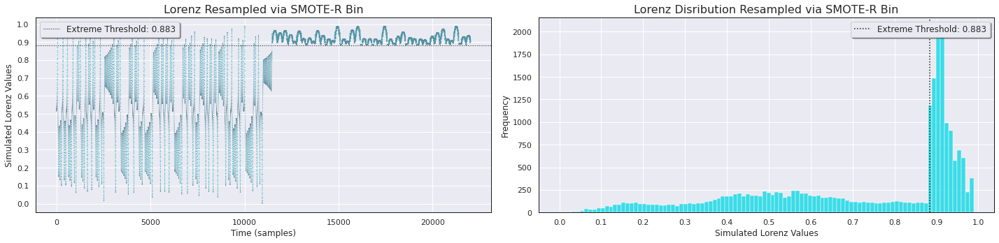

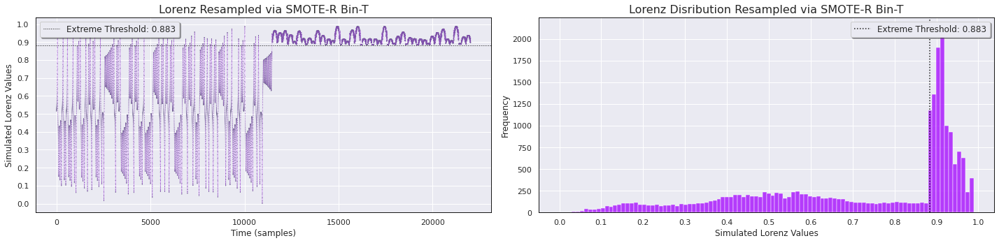

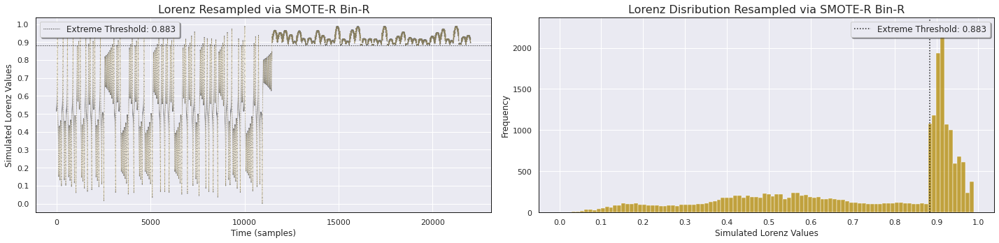

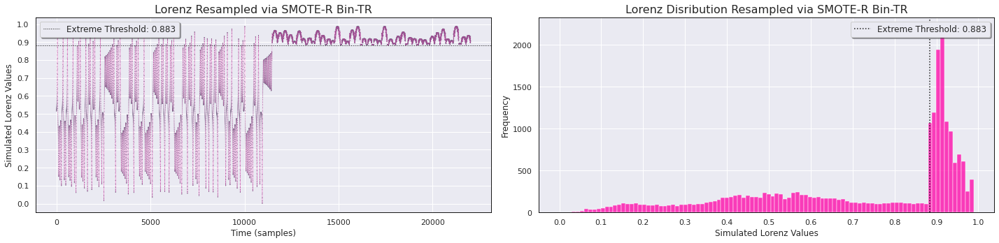

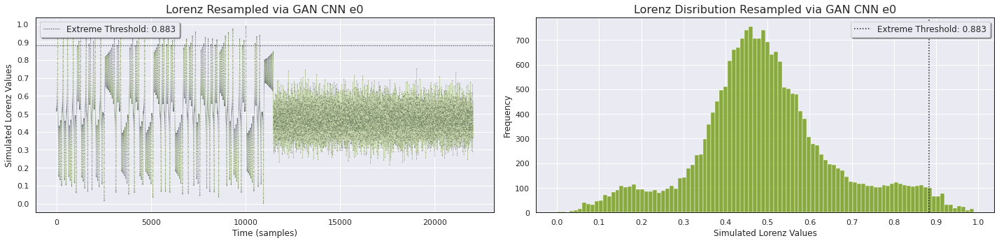

...

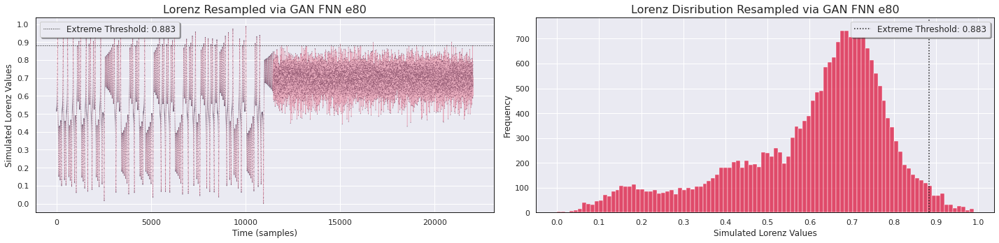

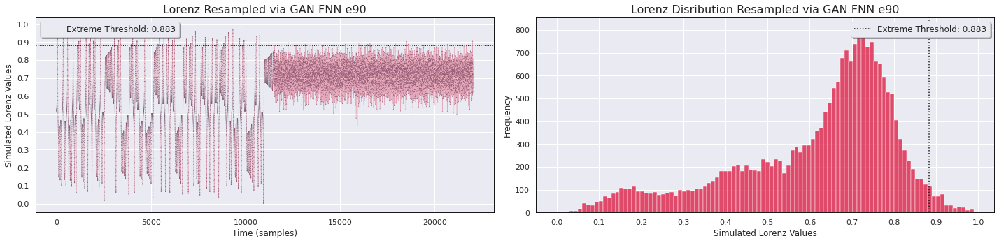

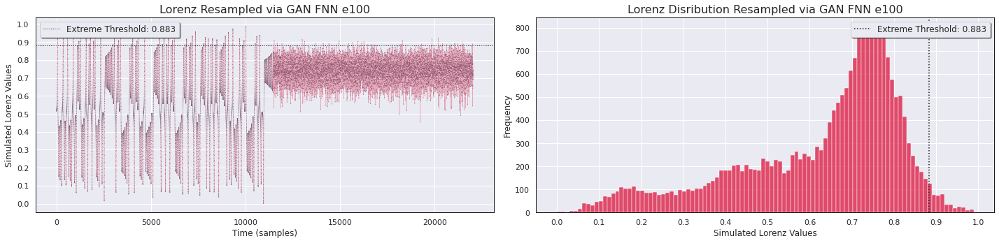

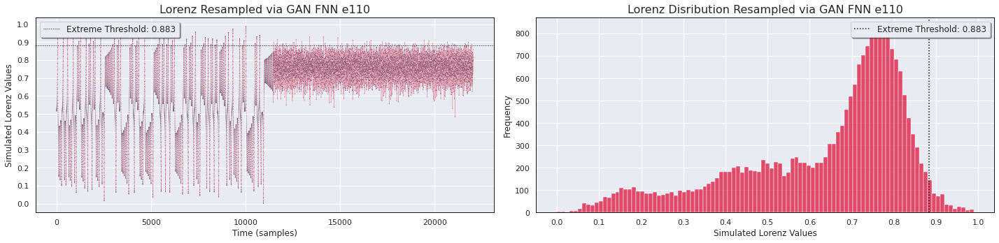

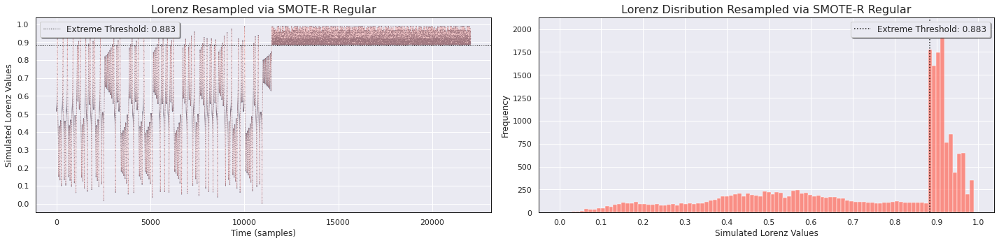

In [11]:
#import plt_utils as pu
#importlib.reload(pu)
#only plots first step out in each embedded
pu.PlotResampledResults(resampling_results, k_X.shape[0], N_STEPS_OUT,EXTREMES_THRESHOLD, TVAR, DATA_NAME)

### Remove Bad GANs

Save time training the forecasters by removing GANs that will clearly generate bad results

In [12]:
all_resampling_results = resampling_results.copy() #save a copy just incase
to_delete = ['GAN_CNN_e0', 'GAN_CNN_e10', 'GAN_CNN_e20', 'GAN_CNN_e30', 'GAN_CNN_e40', 'GAN_CNN_e50', 'GAN_CNN_e60', 'GAN_CNN_e70', 'GAN_CNN_e80', 'GAN_CNN_e90', 'GAN_FNN_e0', 'GAN_FNN_e10', 'GAN_FNN_e20', 'GAN_FNN_e30', 'GAN_FNN_e40', 'GAN_FNN_e50', 'GAN_FNN_e60', 'GAN_FNN_e70', 'GAN_FNN_e80', 'GAN_FNN_e90']
print(resampling_results.keys())
for d in to_delete:
    del resampling_results[d]
print(resampling_results.keys())

dict_keys(['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_r', 'SMOTER_bin_tr', 'GAN_CNN_e0', 'GAN_CNN_e10', 'GAN_CNN_e20', 'GAN_CNN_e30', 'GAN_CNN_e40', 'GAN_CNN_e50', 'GAN_CNN_e60', 'GAN_CNN_e70', 'GAN_CNN_e80', 'GAN_CNN_e90', 'GAN_CNN_e100', 'GAN_CNN_e110', 'GAN_FNN_e0', 'GAN_FNN_e10', 'GAN_FNN_e20', 'GAN_FNN_e30', 'GAN_FNN_e40', 'GAN_FNN_e50', 'GAN_FNN_e60', 'GAN_FNN_e70', 'GAN_FNN_e80', 'GAN_FNN_e90', 'GAN_FNN_e100', 'GAN_FNN_e110', 'SMOTER_regular'])
dict_keys(['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_r', 'SMOTER_bin_tr', 'GAN_CNN_e100', 'GAN_CNN_e110', 'GAN_FNN_e100', 'GAN_FNN_e110', 'SMOTER_regular'])


# **Running Forecasting Experiments**

**Init Evaluator object for model eval metrics**

In [13]:
import evaluator as ev
importlib.reload(ev)

#NOTE: evaler_params must include CaseWeight else errors in MODEL_LSTM
evaluator_params = { "RMSE": {},
                     "RMSERare": {},
                     "Utility": {'m':0.5},
                     "CaseWeight": {'m':0.5},
                     "PrecisionRecall": {},
                     "FScore": {'beta':0.5},
                     #"RelevanceROC": {},
                   }
EVALERS = {}
for f in FORECASTERS:
    EVALERS[f] = ev.Evaluator(evaluator_params, RELEVANCE_THRESHOLD, RELEVANCE_FUNCTION)

#EVALER = ev.Evaluator(evaluator_params, RELEVANCE_THRESHOLD, RELEVANCE_FUNCTION)
RECORDER.save_param_dict({"Evaluator":evaluator_params})

**Train and evaluate an LSTM for each resampling strategy**

In [14]:
NUM_EXPERIMENTS = 10

def main(time_step, X_train, X_test, Y_train, Y_test, resampling_results, evalers, recorder, train_params):   
    recorder.log_print(f"Starting forecasting experiments with num_exps: {train_params['num_exp']} and epochs: {train_params['epochs']}")
    recorder.save_param_dict({"Forecasting":{"NumExp":train_params['num_exp'], "nEpochs": train_params['epochs'], "hidden":train_params['hidden']}})
    
    forecast_results = {}
    for f in FORECASTERS:
        print(f"############## no_resample : {f} ##############")
        if f == "LSTM":
            best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_LSTM(X_train, X_test, Y_train, Y_test, "no_resample", train_params, evalers[f], recorder.log_print)
        else:
            best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_CNN(X_train, X_test, Y_train, Y_test, "no_resample", train_params, evalers[f], recorder.log_print)
    
        results = {'predict_test':best_predict_test,'predict_train':best_predict_train,'X_train':X_train,'Y_train':Y_train,'model':best_model}
        forecast_results[f] = {}
        forecast_results[f]['no_resample'] = results
    
    
    for key in resampling_results.keys():
        res = resampling_results[key]
        X_res = res[:,:(N_STEPS_IN*N_FVARS)]
        X_res = X_res.reshape((X_res.shape[0],N_STEPS_IN,N_FVARS))
        Y_res = res[:,(N_STEPS_IN*N_FVARS):]
        for f in FORECASTERS:
            print(f"############## {key} : {f} ##############")
            if f == "LSTM":
                best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_LSTM(X_res, X_test, Y_res, Y_test, key, train_params, evalers[f], recorder.log_print)
            else:
                best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_CNN(X_res, X_test, Y_res, Y_test, key, train_params, evalers[f], recorder.log_print)
        
            results = {'predict_test':best_predict_test,'predict_train':best_predict_train,'X_train':X_res,'Y_train':Y_res,'model':best_model}
            forecast_results[f][key] = results
    
    return forecast_results

TRAIN_PARAMS = {
        'num_exp': NUM_EXPERIMENTS, 
        'n_steps_in': N_STEPS_IN,
        'n_steps_out': N_STEPS_OUT,
        'epochs': 100,
        'hidden': 100,
        'forecast_dir': FORECAST_DIR,
        'n_fvars': N_FVARS
    }

forecast_results = main(N_STEPS_IN, X_train, X_test, Y_train, Y_test, resampling_results, EVALERS, RECORDER, TRAIN_PARAMS)

print("$$$$ FINISHED FORECASTING EXPERIMENTS $$$$")

LOG: 19:45:33:024 Starting forecasting experiments with num_exps: 10 and epochs: 100

############## no_resample : LSTM ##############
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               40800     
                                                                 
 dense (Dense)               (None, 5)                 505       
                                                                 
Total params: 41,305
Trainable params: 41,305
Non-trainable params: 0
_________________________________________________________________
LOG: 19:45:33:210 Starting LSTM forecaster training on no_resample

LOG: 19:45:33:210 	Experiment 1 in progress



2023-10-26 19:45:33.038608: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-26 19:45:33.038799: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-10-26 19:45:33.038877: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2023-10-26 19:45:33.038923: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2023-10-26 19:45:33.038972: W tensorf

154/154 [==============================] - 0s 2ms/step
LOG: 19:47:06:213 	Experiment 2 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 19:48:37:521 	Experiment 3 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 19:50:04:387 	Experiment 4 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 19:51:33:379 	Experiment 5 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 19:52:57:298 	Experiment 6 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 19:54:21:107 	Experiment 7 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 19:55:44:861 	Experiment 8 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 19:57:08:329 	Experiment 9 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 19:58:32:387 	Experiment 10 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 19:59:56:541 Total time for 10 no_resam

LOG: 20:29:28:226 	Experiment 1 in progress

154/154 [==============================] - 0s 822us/step
LOG: 20:30:02:992 	Experiment 2 in progress

154/154 [==============================] - 0s 785us/step
LOG: 20:30:37:429 	Experiment 3 in progress

154/154 [==============================] - 0s 774us/step
LOG: 20:31:11:526 	Experiment 4 in progress

154/154 [==============================] - 0s 793us/step
LOG: 20:31:45:684 	Experiment 5 in progress

154/154 [==============================] - 0s 781us/step
LOG: 20:32:19:681 	Experiment 6 in progress

154/154 [==============================] - 0s 819us/step
LOG: 20:32:54:146 	Experiment 7 in progress

154/154 [==============================] - 0s 775us/step
LOG: 20:33:28:313 	Experiment 8 in progress

154/154 [==============================] - 0s 764us/step
LOG: 20:34:02:203 	Experiment 9 in progress

154/154 [==============================] - 0s 799us/step
LOG: 20:34:36:808 	Experiment 10 in progress

154/154 [===========================

154/154 [==============================] - 0s 2ms/step
LOG: 21:15:23:833 	Experiment 4 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 21:18:03:161 	Experiment 5 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 21:20:42:538 	Experiment 6 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 21:23:22:119 	Experiment 7 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 21:26:01:594 	Experiment 8 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 21:28:41:210 	Experiment 9 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 21:31:20:628 	Experiment 10 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 21:33:59:844 Total time for 10 SMOTER_bin_r experiments 1594.4577803611755

############## SMOTER_bin_r : CNN ##############
Model: "sequential_7"
_________________________________________________________________
 Layer (type)             

154/154 [==============================] - 0s 2ms/step
LOG: 22:55:05:018 	Experiment 5 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 22:57:45:640 	Experiment 6 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 23:00:26:744 	Experiment 7 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 23:03:07:329 	Experiment 8 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 23:05:48:257 	Experiment 9 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 23:08:28:009 	Experiment 10 in progress

154/154 [==============================] - 0s 2ms/step
LOG: 23:11:06:777 Total time for 10 GAN_CNN_e110 experiments 1604.1606283187866

############## GAN_CNN_e110 : CNN ##############
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 4, 32)             96  

154/154 [==============================] - 0s 765us/step
LOG: 23:46:00:184 	Experiment 5 in progress

154/154 [==============================] - 0s 817us/step
LOG: 23:46:34:671 	Experiment 6 in progress

154/154 [==============================] - 0s 793us/step
LOG: 23:47:09:076 	Experiment 7 in progress

154/154 [==============================] - 0s 780us/step
LOG: 23:47:43:551 	Experiment 8 in progress

154/154 [==============================] - 0s 777us/step
LOG: 23:48:17:913 	Experiment 9 in progress

154/154 [==============================] - 0s 805us/step
LOG: 23:48:52:499 	Experiment 10 in progress

154/154 [==============================] - 0s 781us/step
LOG: 23:49:26:927 Total time for 10 GAN_FNN_e100 experiments 345.3930230140686

############## GAN_FNN_e110 : LSTM ##############
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 100)     

## *SAVE EVALER RESULTS ---- DON'T FORGET*

In [15]:
for f in FORECASTERS:
    RECORDER.save_all_evaler_exps(EVALERS[f].getResultsDf(), f)

### Plot Actual vs Predicted

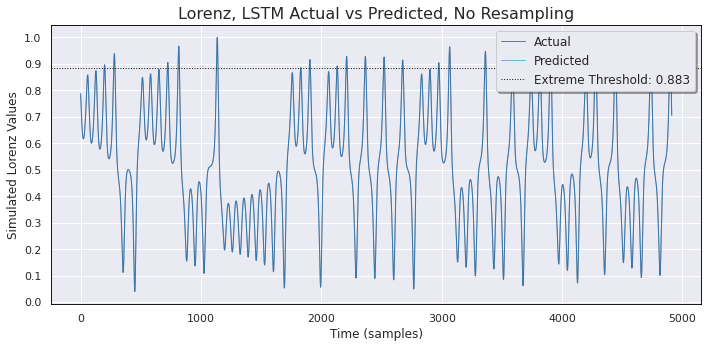

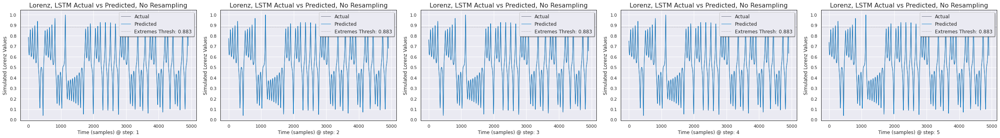

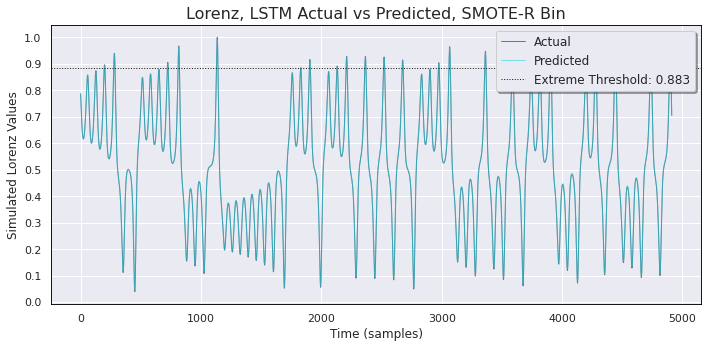

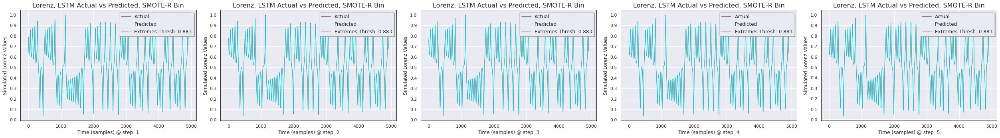

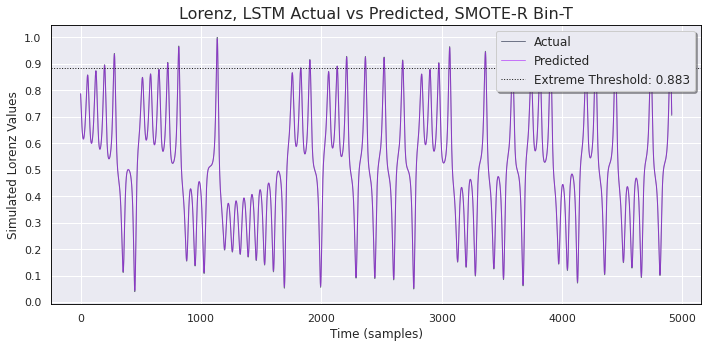

...

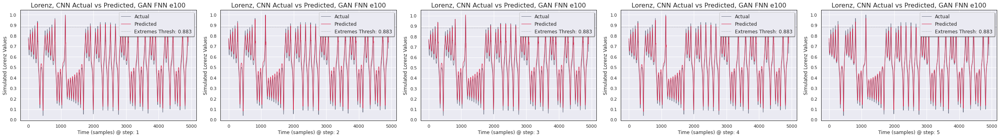

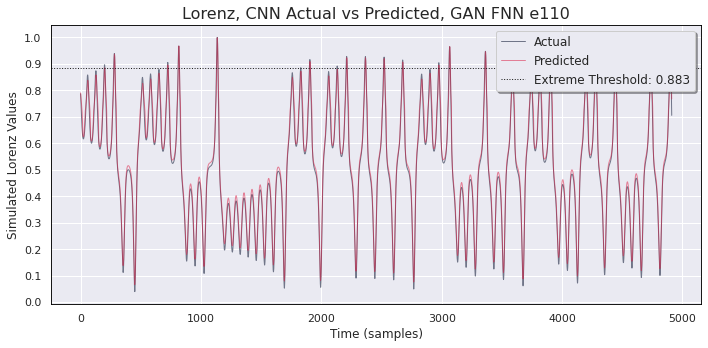

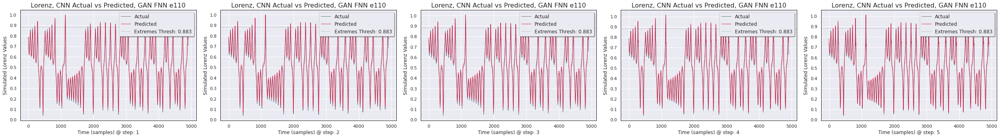

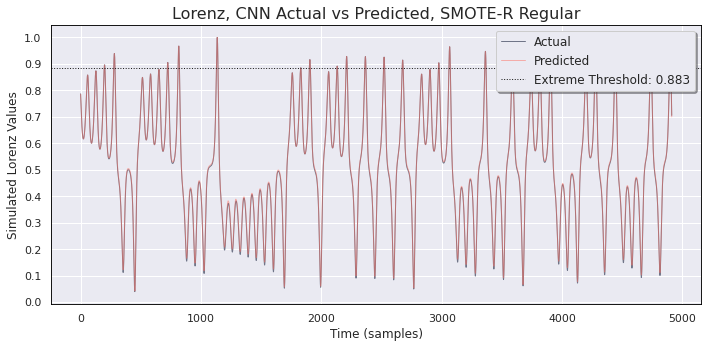

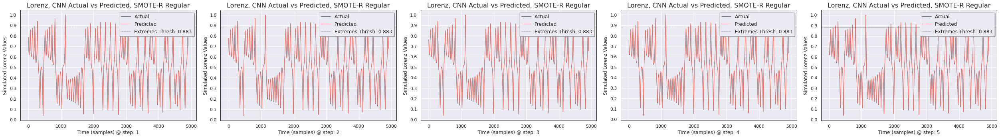

In [16]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)
#print(forecast_results)
#PLOT PRED VS ACTUAL + SAVE_EVAL_RESULTS
for f in FORECASTERS:
    for key in forecast_results[f].keys():
        y_predict_test = forecast_results[f][key]['predict_test']
        #Plot a single Actual vs Predicted figure for only one chosen step out: 0 for first step
        pu.PlotPredVsActual1D(Y_test, y_predict_test, key, EXTREMES_THRESHOLD, TVAR, DATA_NAME, f, 0)
        #Plot a Actual vs Predicted for all steps out in one figure
        pu.PlotPredVsActualSteps(Y_test, y_predict_test, key, EXTREMES_THRESHOLD, TVAR, DATA_NAME, N_STEPS_OUT, f)
        #Save forecasting model
        RECORDER.save_LSTM(forecast_results[f][key]['model'], key)
        #TODO: save CNN and LSTM with same function

### Record KS Statistic and Plot Extremes Distribution for Each Resampling Strategy

KS statistic: 0.07832489536524345, p-value: 0.010925107353730435


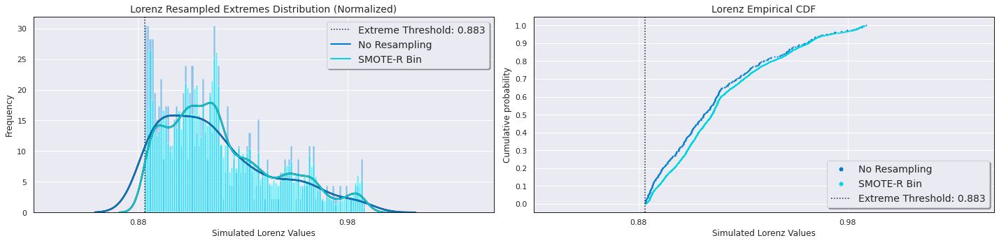

KS statistic: 0.09177821779047751, p-value: 0.0015753939898184419


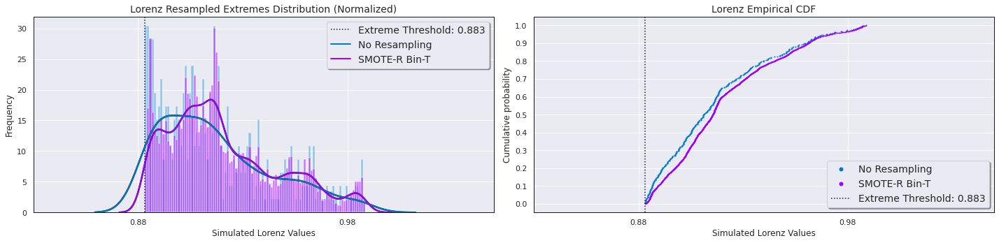

KS statistic: 0.12050287918489622, p-value: 8.999972781200073e-06


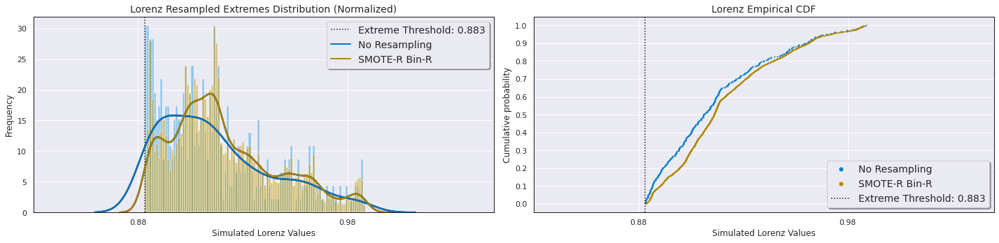

KS statistic: 0.117791663208483, p-value: 1.556340090812206e-05


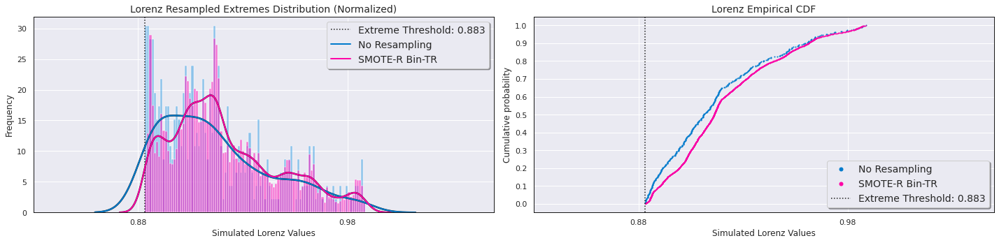

KS statistic: 0.0, p-value: 1.0


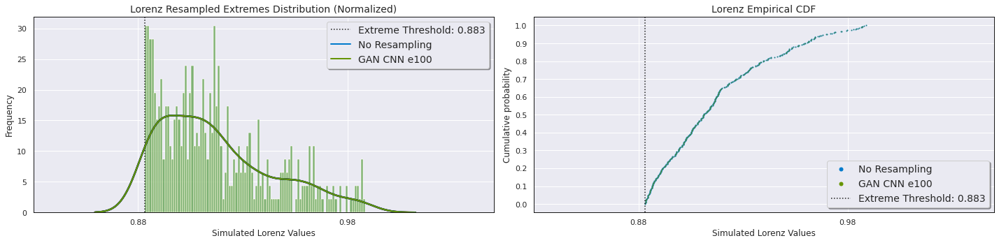

KS statistic: 0.0, p-value: 1.0


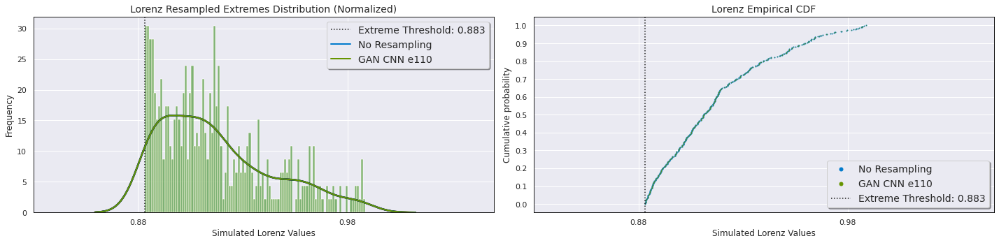

KS statistic: 0.03737282354705589, p-value: 0.8923030249363807


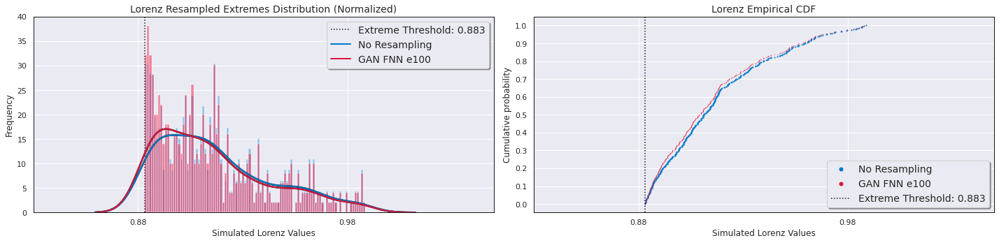

KS statistic: 0.055147348926156116, p-value: 0.4598535197491976


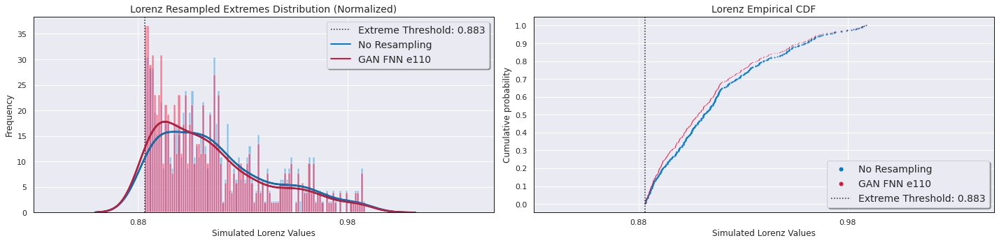

KS statistic: 0.016868465158756105, p-value: 0.9996365558017679


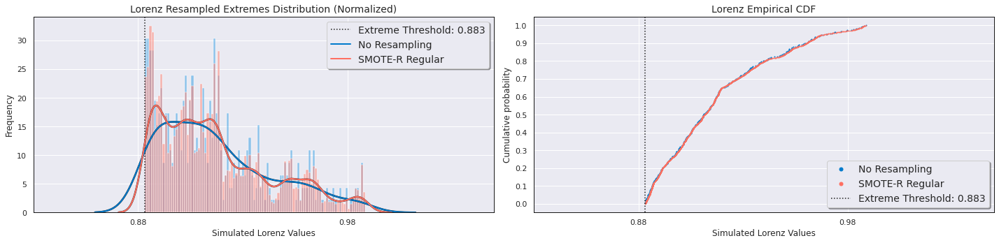

In [17]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)
from scipy.stats import ks_2samp
import scipy.stats as stats

step_out = 0
#get extremes for original data
y_orig_rel = RELEVANCE_FUNCTION.__call__(Y_train[:,step_out])
rare_mask = [val >= RELEVANCE_THRESHOLD for val in y_orig_rel]
y_orig_rare = Y_train[rare_mask]
ks_results = []
for key, res in resampling_results.items():
    #get extremes for resampled data
    y_res = res[:,(N_STEPS_IN*N_FVARS):]
    y_rel = RELEVANCE_FUNCTION.__call__(y_res[:,step_out])
    rare_mask = [val >= RELEVANCE_THRESHOLD for val in y_rel]
    y_rare = y_res[rare_mask]

    # Perform the Kolmogorov-Smirnov test
    statistic, p_value = ks_2samp(y_orig_rare[:,step_out], y_rare[:,step_out])
    print(f"KS statistic: {statistic}, p-value: {p_value}")
    ks_results.append({'Res':key, 'ksStat':statistic, 'pValue':p_value})
    #Plot extremes hist and cdf for each strategy vs original data
    pu.PlotExremesDistribution(y_orig_rare, y_rare, key, step_out, EXTREMES_THRESHOLD, TVAR, DATA_NAME)
    

ks_df = pd.DataFrame(ks_results)
RECORDER.save_ks(ks_df)

### Prepare Data for Comparison Plots

If we include all strategies on the comparison plots they will be really cluttered and almost useless to the reader. In the following cell we choose the best CNN_GAN, FNN_GAN, and SMOTER_bin approach from the RMSERare of the forecasting results and only include these on the comparison plots. 

Later we'll also use this cell to load the base resampling results / eval metrics to include on the comparison plots along side the next generation of resampling strategies

In [18]:
def calculate_mean(lst):
    return sum(lst) / len(lst)

#Combine EVALER from loaded experiments
#Combine resampling results from loaded experiments
#np.loadtxt('test.txt', delimiter=',', dtype=float)

#TODO: come up with a way to make a copy of evaler so we don't have to filter best strategies for the clustered bar plots

#best_resampling_results will contain best GANs, best SMOTERs
best_resampling_results = resampling_results.copy()
best_cnn_gan = ""
best_fnn_gan = ""
best_bin = ""

def get_best_resampling(forecaster, best, evaler, metric, recorder):
    exp_sum = evaler.getExperimentSummaryDf(metric)
    #get best CNN_GAN if used
    cnn_exp_sum = exp_sum[exp_sum['Res'].str.contains("GAN_CNN")]
    if not cnn_exp_sum.empty:
        #apply mean to all rows
        cnn_exp_sum[f"{metric}_Test_Mean"] = cnn_exp_sum[f"{metric}_Test_Mean"].apply(calculate_mean)
        max_cw_idx = cnn_exp_sum[f"{metric}_Test_Mean"].idxmin()
        best_cnn_gan = cnn_exp_sum.at[max_cw_idx, "Res"]
        print(f"Best CNN_GAN for {forecaster}: {best_cnn_gan}")
        keys_to_delete = [key for key in best['resampling_results'].keys() if "GAN_CNN" in key and key != best_cnn_gan]
        print(f"deleting keys: {keys_to_delete}")
        for key in keys_to_delete:
            del best['resampling_results'][key]
        best['cnn_gan'] = best_cnn_gan
        ekey = int(best_cnn_gan.split('_')[-1][1:])
        recorder.save_gan(CNN_GENS[ekey], CNN_DISCS[ekey], "CNN", best_cnn_gan)
    
    #get best FNN_GAN if used
    fnn_exp_sum = exp_sum[exp_sum['Res'].str.contains("GAN_FNN")]
    if not fnn_exp_sum.empty:
        #apply mean to all rows
        fnn_exp_sum[f"{metric}_Test_Mean"] = fnn_exp_sum[f"{metric}_Test_Mean"].apply(calculate_mean)
        max_cw_idx = fnn_exp_sum[f"{metric}_Test_Mean"].idxmin()
        best_fnn_gan = fnn_exp_sum.at[max_cw_idx, "Res"]
        print(f"Best FNN_GAN for {forecaster}: {best_fnn_gan}")
        keys_to_delete = [key for key in best['resampling_results'].keys() if "GAN_FNN" in key and key != best_fnn_gan]
        print(f"deleting keys: {keys_to_delete}")
        for key in keys_to_delete:
            del best['resampling_results'][key]
        best['fnn_gan'] = best_fnn_gan
        ekey = int(best_fnn_gan.split('_')[-1][1:])
        RECORDER.save_gan(FNN_GENS[ekey], FNN_DISCS[ekey], "FNN", best_fnn_gan)
    #get best SMOTER_bin if used
    bin_exp_sum = exp_sum[exp_sum['Res'].str.contains("SMOTER_bin")] 
    if not bin_exp_sum.empty:
        bin_exp_sum[f"{metric}_Test_Mean"] = bin_exp_sum[f"{metric}_Test_Mean"].apply(calculate_mean)
        max_cw_idx = bin_exp_sum[f"{metric}_Test_Mean"].idxmin()
        best_bin = bin_exp_sum.at[max_cw_idx, "Res"]
        print(f"Best SMOTER bin for {forecaster}: {best_bin}")
        keys_to_delete = [key for key in best['resampling_results'].keys() if "SMOTER_bin" in key and key != best_bin]
        print(f"deleting keys: {keys_to_delete}")
        for key in keys_to_delete:
            del best['resampling_results'][key]
        best['bin'] = best_bin
    return best #?
                                                         

BEST_RESULTS = {}
for f in FORECASTERS:
    BEST_RESULTS[f] = {'resampling_results': resampling_results.copy(), 'cnn_gan': "", 'fnn_gan': "", "bin": ""}
    #do below stuff with argument 'f'
    BEST_RESULTS[f] = get_best_resampling(f, BEST_RESULTS[f], EVALERS[f], 'RMSERare', RECORDER) #?
    RECORDER.save_resample_results_np(BEST_RESULTS[f]['resampling_results'], f)


#load all resampling results
#COMBINE_RESAMPLING_RESULTS_DIR = Path("Sessions/Bike/2023-October-13 13-41-03-532984").joinpath("resample_results")

#add loaded resampling results to best_resampling_results
#best_resampling_results.update({file.stem: np.loadtxt(file, delimiter=',', dtype=float)
#                  for file in COMBINE_RESAMPLING_RESULTS_DIR.iterdir() if file.is_file()})

Best CNN_GAN for LSTM: GAN_CNN_e110
deleting keys: ['GAN_CNN_e100']
Best FNN_GAN for LSTM: GAN_FNN_e100
deleting keys: ['GAN_FNN_e110']
Best SMOTER bin for LSTM: SMOTER_bin_r
deleting keys: ['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_tr']
LOG: 00:55:15:088 Saving resample results numpy style

Best CNN_GAN for CNN: GAN_CNN_e110
deleting keys: ['GAN_CNN_e100']
Best FNN_GAN for CNN: GAN_FNN_e110
deleting keys: ['GAN_FNN_e100']
Best SMOTER bin for CNN: SMOTER_bin_r
deleting keys: ['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_tr']
LOG: 00:55:15:730 Saving resample results numpy style



### Compare KDEs and CDFs

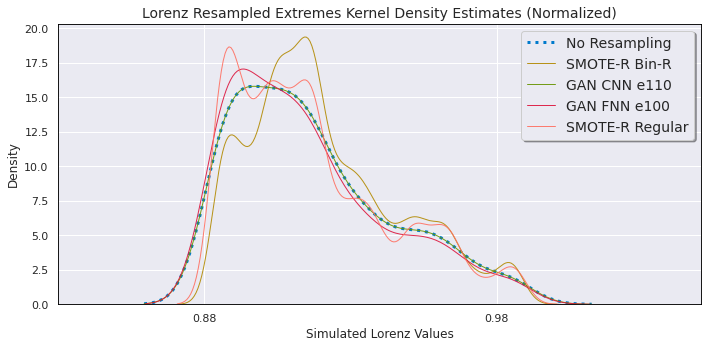

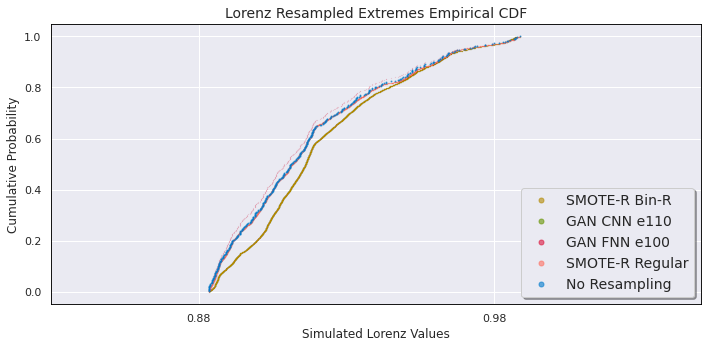

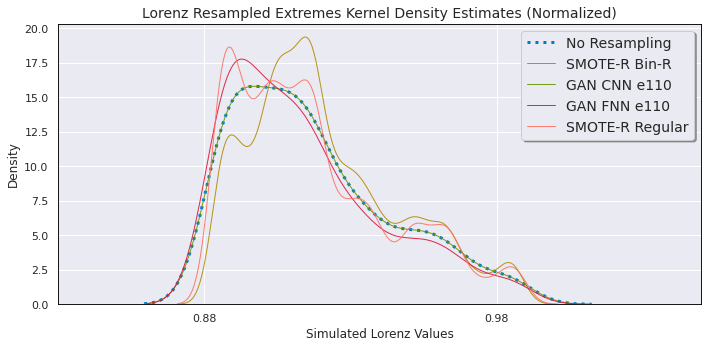

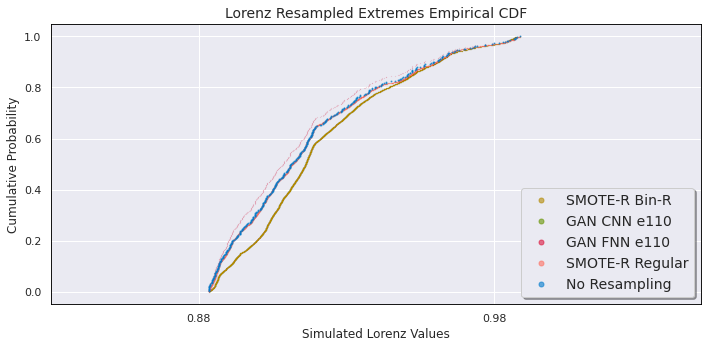

In [19]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)
step_out = 0

#compare KDE, CDF
for f in FORECASTERS:
    pu.PlotKDECompare(Y_train, BEST_RESULTS[f]['resampling_results'], RELEVANCE_FUNCTION, RELEVANCE_THRESHOLD, step_out, N_STEPS_IN*N_FVARS, EXTREMES_THRESHOLD, TVAR, DATA_NAME, f)    
    pu.PlotCDFCompare(Y_train, BEST_RESULTS[f]['resampling_results'], RELEVANCE_FUNCTION, RELEVANCE_THRESHOLD, step_out, N_STEPS_IN*N_FVARS, EXTREMES_THRESHOLD, TVAR, DATA_NAME, f)    

### Plot Eval Results Aggregated Over All Steps

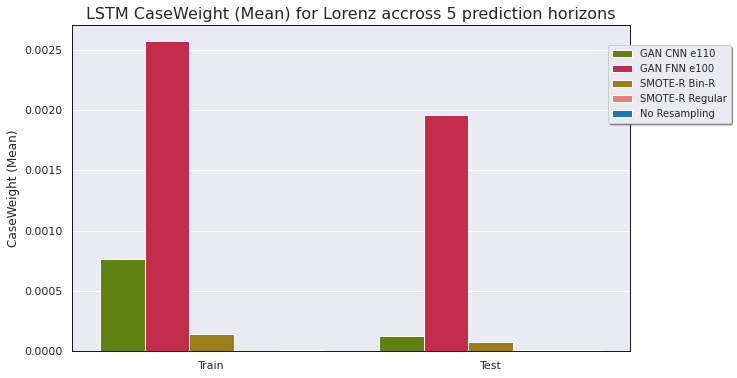

<Figure size 720x432 with 0 Axes>

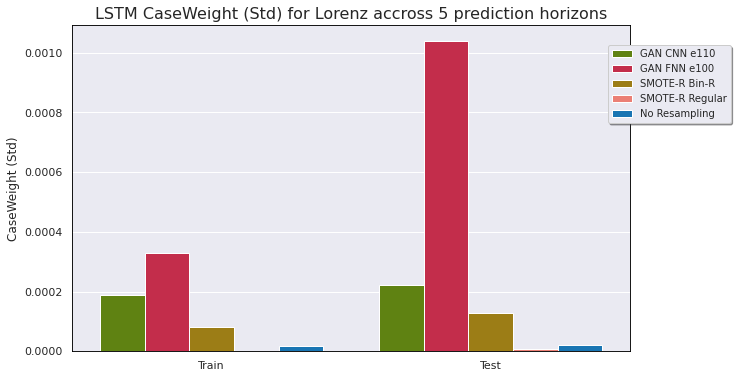

<Figure size 720x432 with 0 Axes>

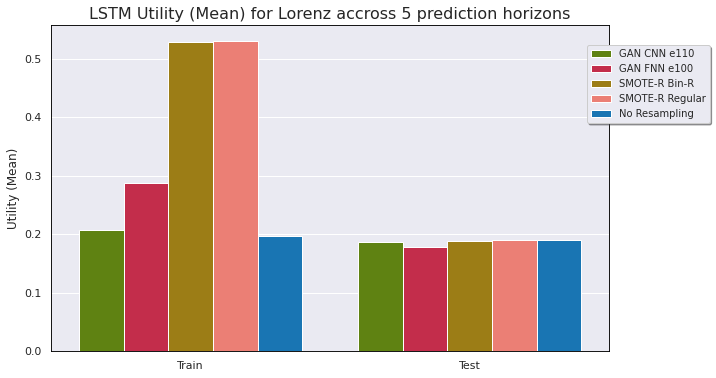

<Figure size 720x432 with 0 Axes>

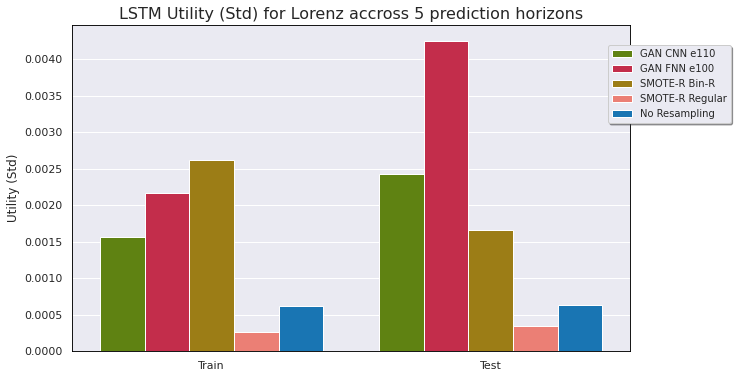

<Figure size 720x432 with 0 Axes>

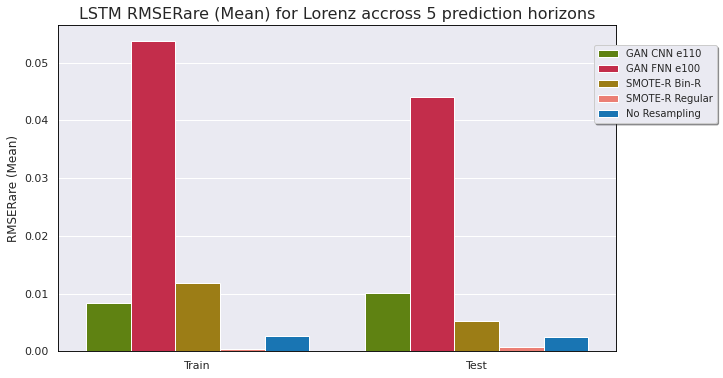

<Figure size 720x432 with 0 Axes>

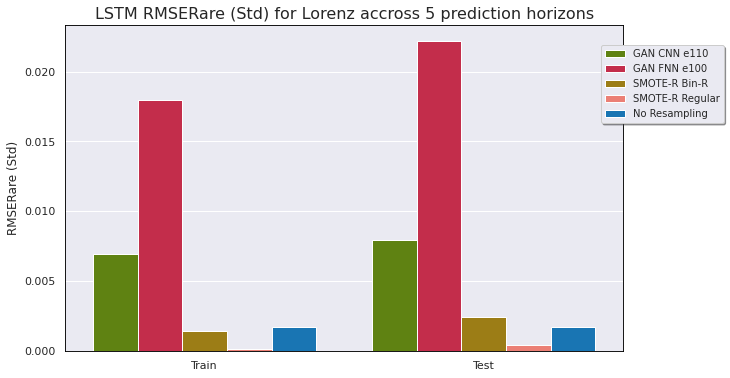

<Figure size 720x432 with 0 Axes>

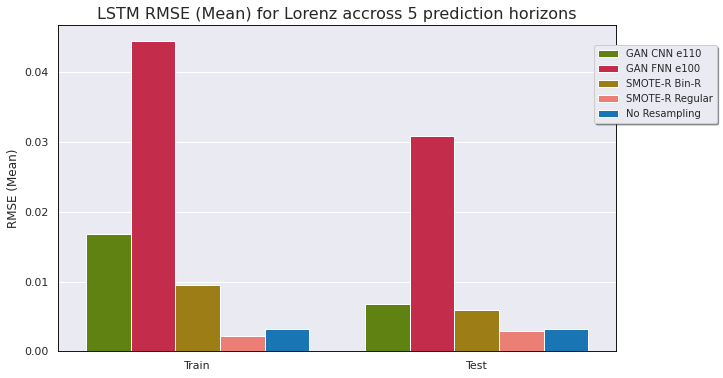

<Figure size 720x432 with 0 Axes>

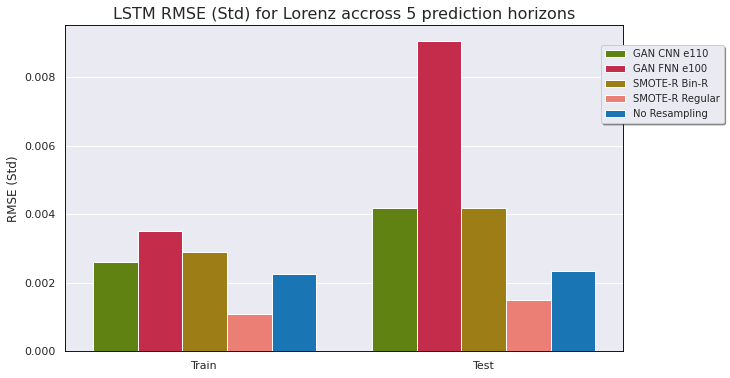

<Figure size 720x432 with 0 Axes>

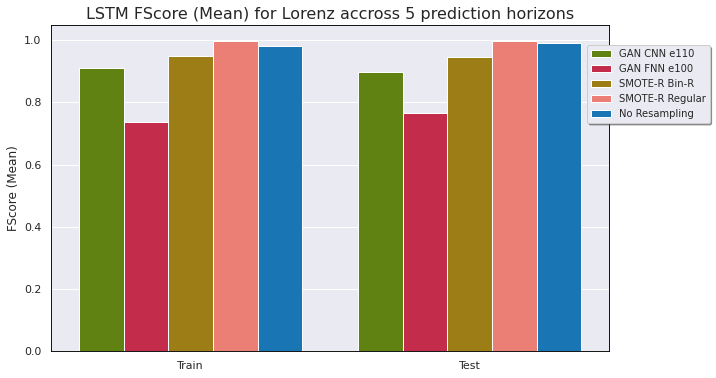

<Figure size 720x432 with 0 Axes>

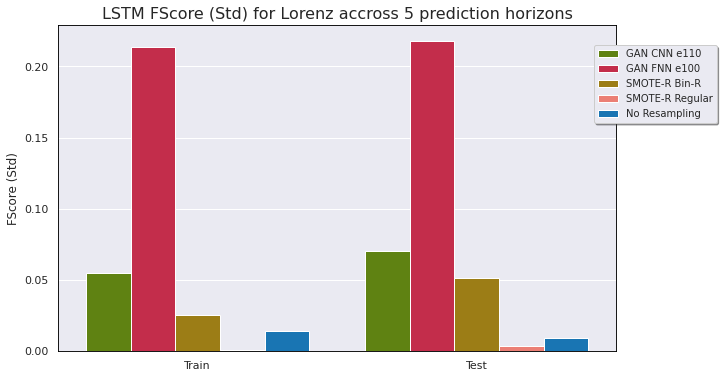

<Figure size 720x432 with 0 Axes>

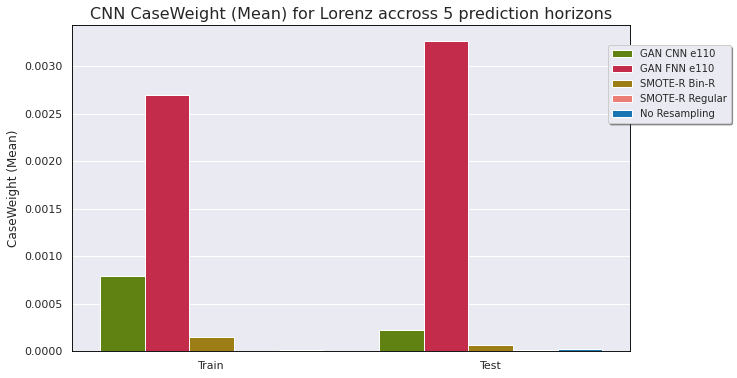

<Figure size 720x432 with 0 Axes>

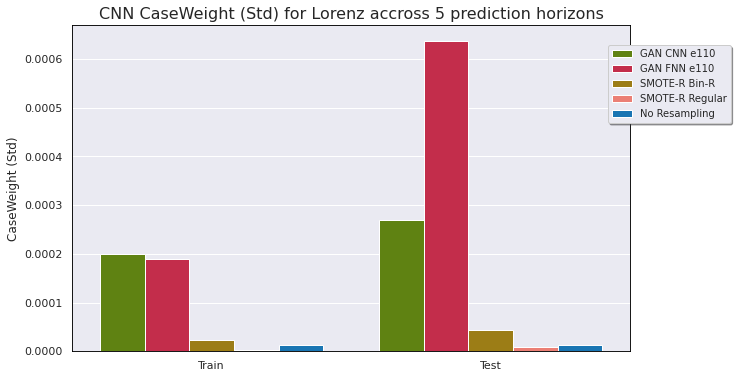

<Figure size 720x432 with 0 Axes>

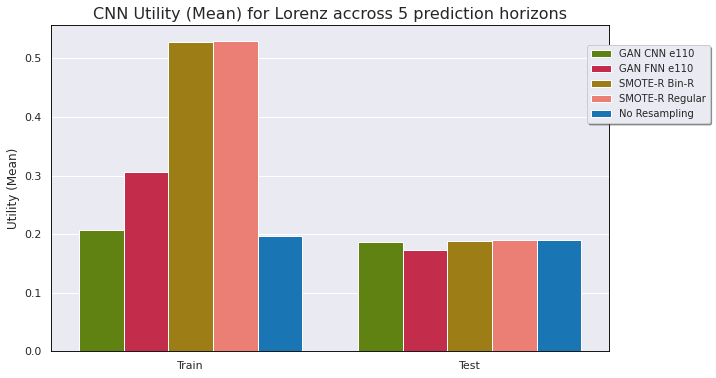

<Figure size 720x432 with 0 Axes>

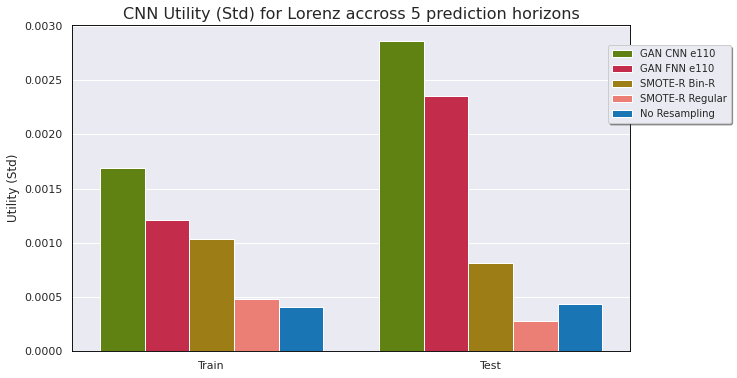

<Figure size 720x432 with 0 Axes>

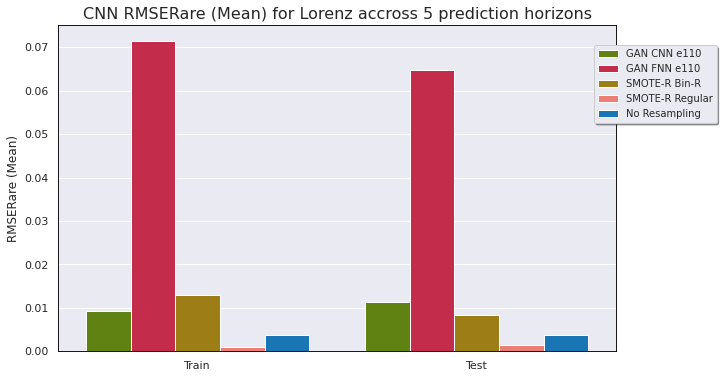

<Figure size 720x432 with 0 Axes>

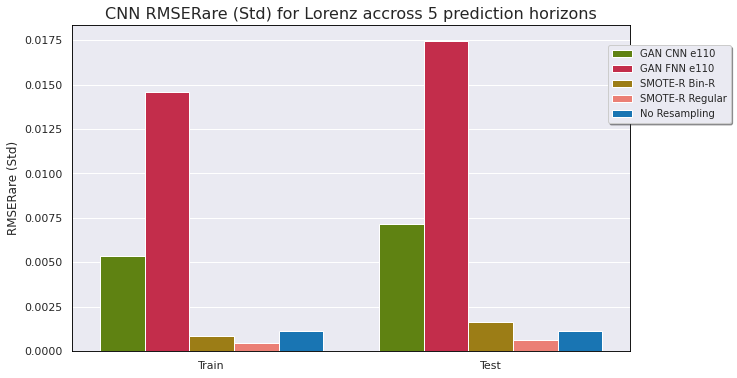

<Figure size 720x432 with 0 Axes>

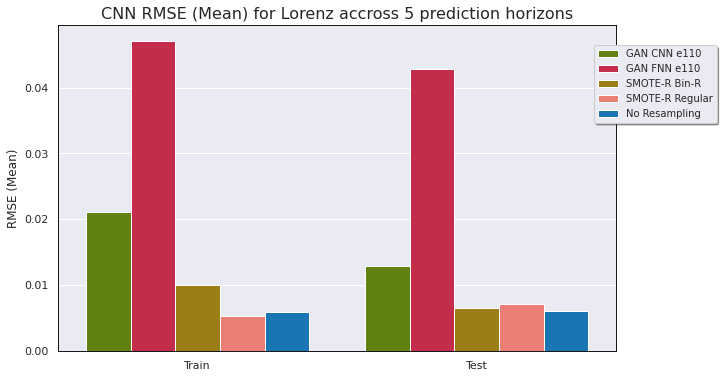

<Figure size 720x432 with 0 Axes>

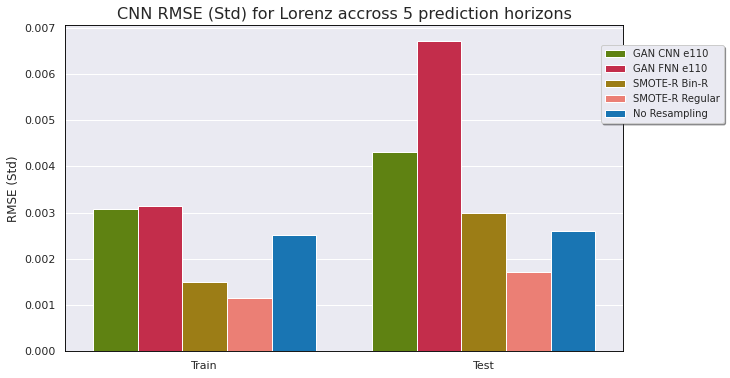

<Figure size 720x432 with 0 Axes>

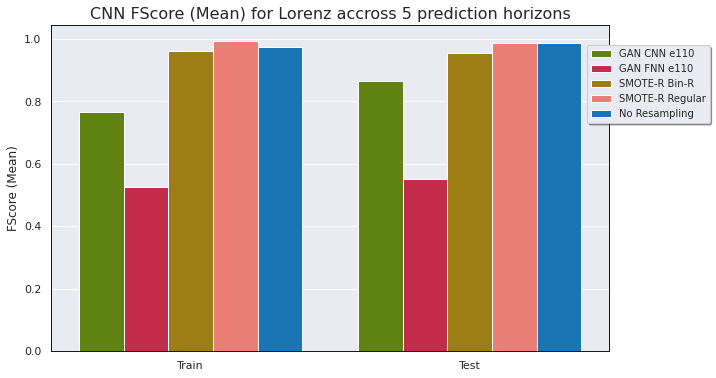

<Figure size 720x432 with 0 Axes>

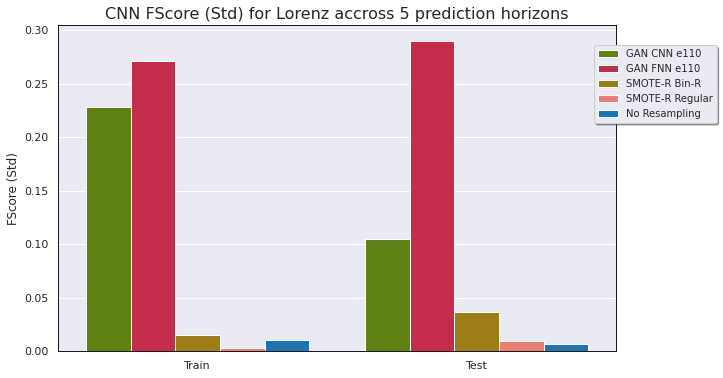

<Figure size 720x432 with 0 Axes>

In [20]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)


def calculate_mean(lst):
    return sum(lst) / len(lst)

#Just plot these metrics:
plot_metrics = ["CaseWeight", "Utility", "RMSERare", "RMSE", "FScore"]

ts = ["Train", "Test"] #one cluster for train, one for test results

#aggs options: 
aggs = ["Mean", "Std"]
## for "Mean" we get the mean of the eval metrics over all experiments and plot its average over time steps
## for "Std" we get the std of the eval metrics over all experiments and plot its average over time steps

#for f in FORECASTERS: EVALER[f], get best_cnn_gan, best_fnn_gan, best_bin from dict
#pass an argument to plotting function to specify f
for f in FORECASTERS:
    best_cnn_gan = BEST_RESULTS[f]['cnn_gan']
    best_fnn_gan = BEST_RESULTS[f]['fnn_gan']
    best_bin = BEST_RESULTS[f]['bin']
    for metric in plot_metrics:
        df_results = EVALERS[f].getExperimentSummaryDf(metric, True)
        df_results_train = EVALERS[f].getExperimentSummaryDf(metric, False)
        df_results[f"{metric}_Train_Mean"] = df_results_train[f"{metric}_Train_Mean"]
        df_results[f"{metric}_Train_Std"] = df_results_train[f"{metric}_Train_Std"]
        # Replace with the mean of the steps out lists
        df_results[f"{metric}_Train_Mean"] = df_results[f"{metric}_Train_Mean"].apply(calculate_mean)
        df_results[f"{metric}_Test_Mean"] = df_results[f"{metric}_Test_Mean"].apply(calculate_mean)
        df_results[f"{metric}_Train_Std"] = df_results[f"{metric}_Train_Std"].apply(calculate_mean)
        df_results[f"{metric}_Test_Std"] = df_results[f"{metric}_Test_Std"].apply(calculate_mean)
        for a in aggs:
            #remove any GAN_CNNs, GAN_FNNs, and SMOTER_bin strategies from the dataframe that aren't the best
            filtered_df = df_results[((df_results['Res'].str.contains('GAN_CNN|GAN_FNN')) & ((df_results['Res'] == best_cnn_gan) | (df_results['Res'] == best_fnn_gan))) | (~df_results['Res'].str.contains('GAN_CNN|GAN_FNN'))]
            filtered_df = filtered_df[((filtered_df['Res'].str.contains('SMOTER_bin')) & (filtered_df['Res'] == best_bin)) | (~filtered_df['Res'].str.contains('SMOTER_bin'))]
            '''
            filtered_df = df_results
            if best_cnn_gan:
                filtered_df = filtered_df[((filtered_df['Res'].str.contains('GAN_CNN')) & (filtered_df['Res'] == best_cnn_gan)) | (~filtered_df['Res'].str.contains('GAN_CNN'))]
            if best_fnn_gan:
                filtered_df = filtered_df[((filtered_df['Res'].str.contains('GAN_FNN')) & (filtered_df['Res'] == best_fnn_gan)) | (~filtered_df['Res'].str.contains('GAN_FNN'))]
            '''
            pu.PlotTrainTestBarResults(filtered_df, metric, a, DATA_NAME, N_STEPS_OUT, f)


### Plot Train and Test Eval Results Clustered By Steps Out

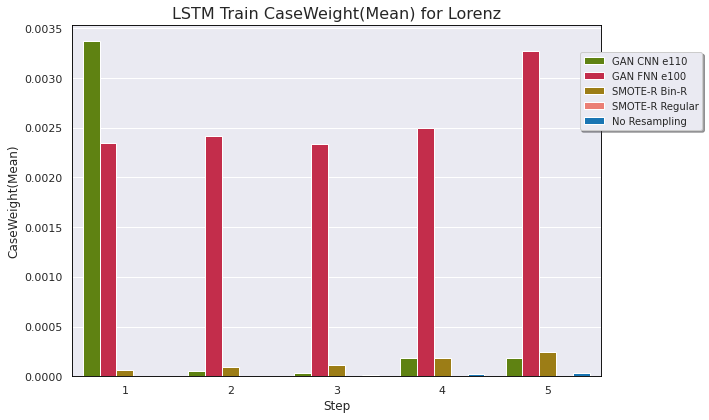

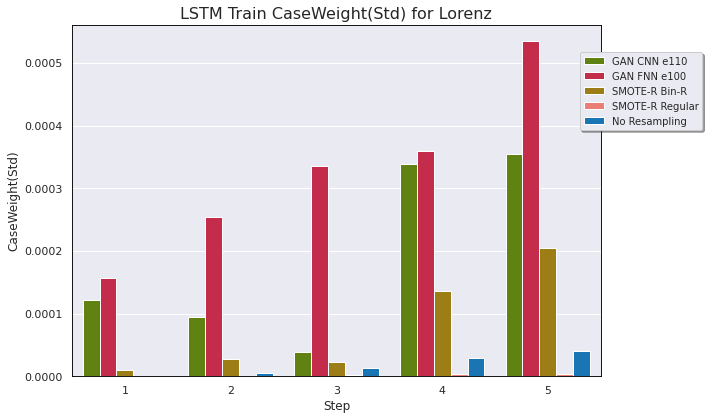

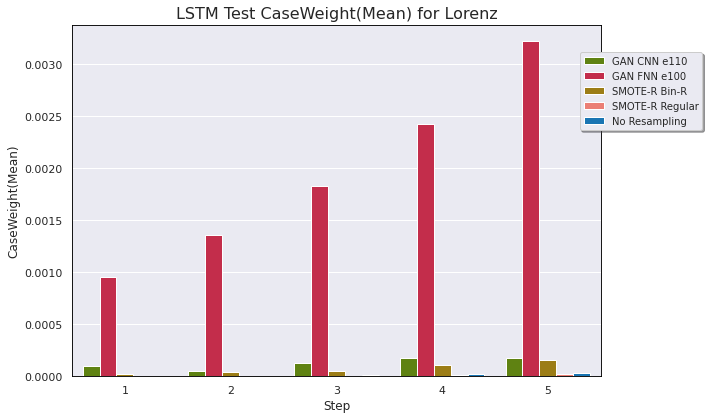

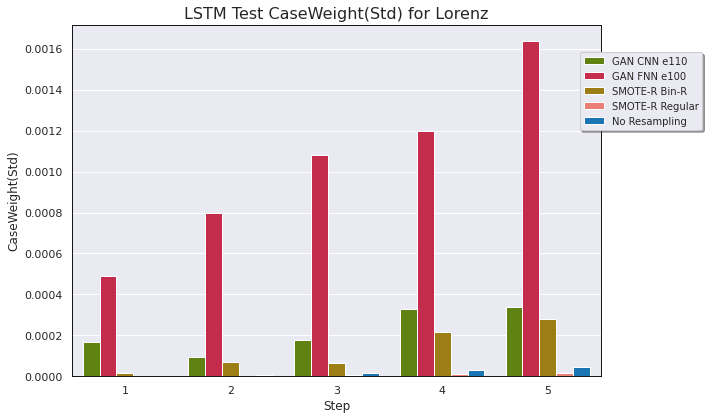

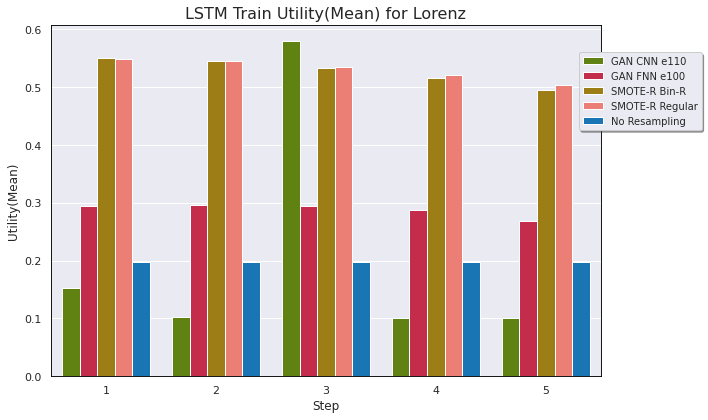

...

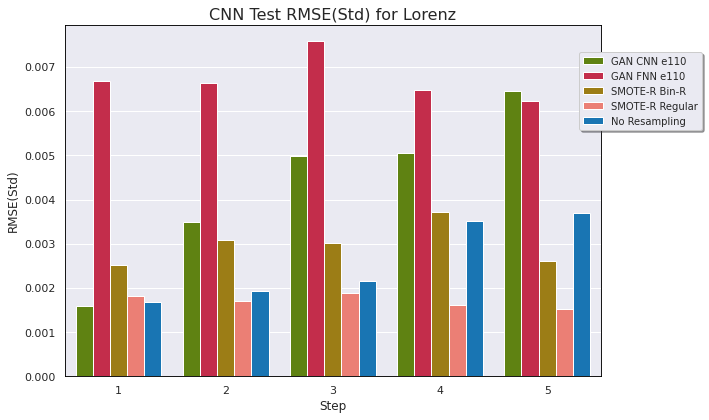

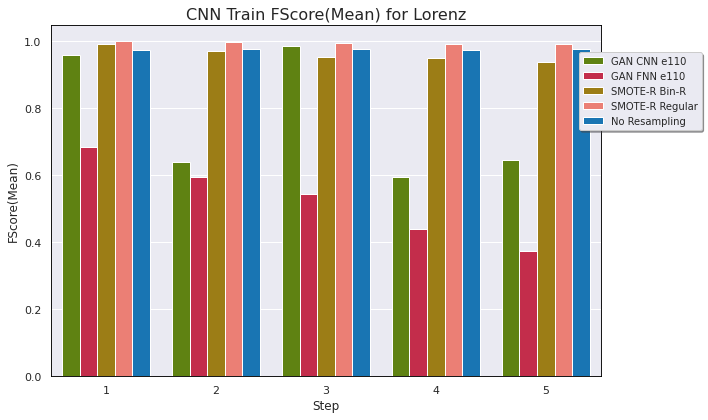

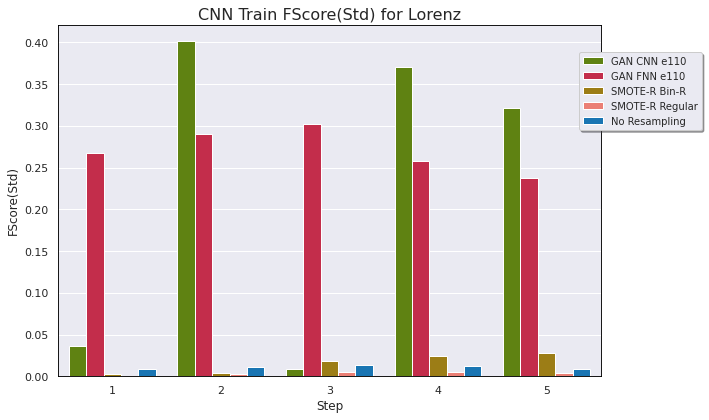

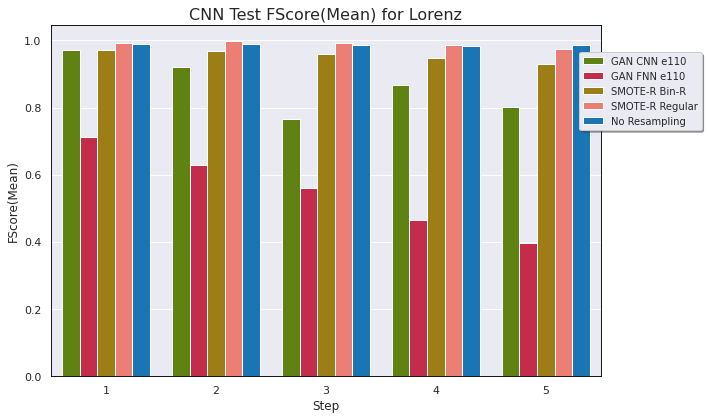

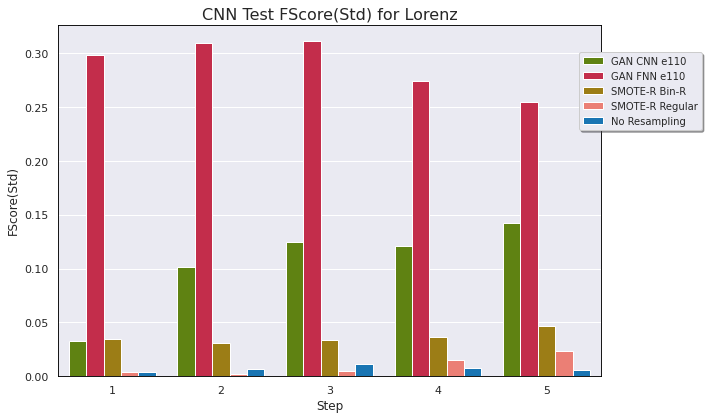

In [21]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)



plot_metrics = ["CaseWeight", "Utility", "RMSERare", "RMSE", "FScore"]
ts = ["Train", "Test"]
aggs = ["Mean", "Std"]
#either plot mean or std of the experiments
for f in FORECASTERS:
    best_cnn_gan = BEST_RESULTS[f]['cnn_gan']
    best_fnn_gan = BEST_RESULTS[f]['fnn_gan']
    best_bin = BEST_RESULTS[f]['bin']
    for metric in plot_metrics:
        for t in ts:
            tb = True if t == "Test" else False
            df_results = EVALERS[f].getExperimentSummaryDf(metric, tb)
            for a in aggs:
                #filter out all GAN_CNNs, GAN_FNNs or SMOTER_bins that aren't the best
                filtered_df = df_results[((df_results['Res'].str.contains('GAN_CNN|GAN_FNN')) & ((df_results['Res'] == best_cnn_gan) | (df_results['Res'] == best_fnn_gan))) | (~df_results['Res'].str.contains('GAN_CNN|GAN_FNN'))]
                filtered_df = filtered_df[((filtered_df['Res'].str.contains('SMOTER_bin')) & (filtered_df['Res'] == best_bin)) | (~filtered_df['Res'].str.contains('SMOTER_bin'))]
                pu.PlotStepBarResults(filtered_df, metric, a, t, DATA_NAME, N_STEPS_OUT, f)